#### Import packages

In [149]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
import numpy as np

temp = pd.read_csv("stage3.csv")

In [150]:
#Organzied by State and time

temp = temp.sort_values(by=['state', "date"])

temp = temp.drop(columns=["incident_url", "address", "source_url", "incident_url_fields_missing", "incident_characteristics", "location_description", "notes", "sources", "state_house_district",
            "state_senate_district", "participant_name", "congressional_district", "city_or_county"])

#### Description of variables used

In [151]:
temp.head(n=5)

,incident_id,date,state,n_killed,n_injured,gun_stolen,gun_type,latitude,longitude,n_guns_involved,participant_age,participant_age_group,participant_gender,participant_relationship,participant_status,participant_type
127,490395,2013-07-06,Alabama,0,4,NaN,NaN,34.7982,-87.6854,NaN,4::22,4::Adult 18+,4::Female,NaN,0::Injured||1::Injured||2::Injured||3::Injured...,0::Victim||1::Victim||2::Victim||3::Victim||4:...
272,496668,2013-12-28,Alabama,3,5,NaN,NaN,32.3719,-86.2952,NaN,0::21||1::22||2::20||3::20||4::23||5::20||6::2...,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Female||1::Male||2::Male||3::Male||4::Male|...,9::Mass shooting - Random victims,0::Killed||1::Killed||2::Injured||3::Injured||...,0::Victim||1::Victim||2::Victim||3::Victim||4:...
296,92342,2014-01-01,Alabama,1,0,NaN,NaN,34.7663,-86.6028,NaN,0::21||1::24,0::Adult 18+||1::Adult 18+,0::Female||1::Male,NaN,0::Killed||1::Unharmed,0::Victim||1::Subject-Suspect
315,94194,2014-01-01,Alabama,0,3,NaN,NaN,33.2482,-87.5670,NaN,3::17||4::19||5::19||6::19,3::Teen 12-17||4::Adult 18+||5::Adult 18+||6::...,0::Male||1::Male||2::Female||3::Male||4::Male|...,NaN,0::Injured||1::Injured||2::Injured||3::Unharme...,0::Victim||1::Victim||2::Victim||3::Subject-Su...
320,92337,2014-01-01,Alabama,1,0,NaN,NaN,31.7839,-86.1926,NaN,0::18||1::19,0::Adult 18+||1::Adult 18+,0::Female||1::Male,NaN,0::Killed||1::Unharmed,0::Victim||1::Subject-Suspect


* incident_id	- ID of shooting incident
* date - date of incident
* state - state where the incident occured	
* n_killed - number of people killed in the incident
* n_injured - number of people injured in the incident
* gun_stolen - guns stolen, unknown, or not stolen for the incident
* gun_type - type of gun involved in the incident
* latitude - the latitude coordinate of the incident
* longitude - the longitude coordinate of the incident
* n_guns_involved	- number of guns involved in the incident
* participant_age	- participants age, killed, injured, or assailant in the incident
* participant_age_group - age group of participants in the incident
* participant_gender	- gender of participants in the incident
* participant_relationship - participant relationships to other participants in the incident
* participant_status - participant status: 'Arrested', 'Killed', 'Injured', or 'Unharmed' in the incident
* participant_type - particpant type:  'Victim' or 'Subject-Suspect in the incident

## Data cleaning process

In [152]:
## Checking the data type of columns

temp.dtypes

temp.info(verbose=True)

##  re-indexing the dataframe

temp = temp.reset_index(drop=True)


<class 'pandas.core.frame.DataFrame'>
Int64Index: 239677 entries, 127 to 239153
Data columns (total 16 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   incident_id               239677 non-null  int64  
 1   date                      239677 non-null  object 
 2   state                     239677 non-null  object 
 3   n_killed                  239677 non-null  int64  
 4   n_injured                 239677 non-null  int64  
 5   gun_stolen                140179 non-null  object 
 6   gun_type                  140226 non-null  object 
 7   latitude                  231754 non-null  float64
 8   longitude                 231754 non-null  float64
 9   n_guns_involved           140226 non-null  float64
 10  participant_age           147379 non-null  object 
 11  participant_age_group     197558 non-null  object 
 12  participant_gender        203315 non-null  object 
 13  participant_relationship  15774 non-null  

In [153]:
# ## Note gun_stolen column values is a string, but with inner and outer separators, according to James' Gun Violence data repo

## But let's make sure that it is in a string format

temp1 = temp.astype({'gun_stolen':str})

## Now create a recursive function to take care of || and :: ....

text_list = [] 
def extract(x):
    """This is a recursive function to extract text separated by ||"""
    ch = '|'
    if ch not in x:
        for i in range(len(x)):
            if x[i] == ":" and x[i+1] == ":":
                text = x[i+2:]
                text_list.append(text)
                return text_list
    else:
        for i in range(len(x)):
            if x[i] == '|' and x[i+1] == '|':
                first_text = x[0:i]
                for j in range(len(first_text)):
                    if first_text[j] == ":" and first_text[j+1] == ":":
                        better_text = first_text[j+2:]
                        text_list.append(better_text)
                        break
                newtext = x[i+2:]
                extract(newtext)
                break
        return text_list


In [154]:
## Now apply extract function to gun_stolen column

for i in range(len(temp1)):
    stats = temp1.loc[i, 'gun_stolen']
    text_list = []
    complete_list = extract(stats)
    temp1.at[i, 'gun_stolen'] = complete_list
    

In [155]:
temp1.sample(5)

,incident_id,date,state,n_killed,n_injured,gun_stolen,gun_type,latitude,longitude,n_guns_involved,participant_age,participant_age_group,participant_gender,participant_relationship,participant_status,participant_type
224616,224690,2014-11-24,Virginia,0,0,None,NaN,39.0228,-77.3780,NaN,NaN,1::Adult 18+,1::Male,NaN,1::Unharmed,0::Victim||1::Subject-Suspect
136519,656518,2016-09-15,Montana,0,0,[Unknown],0::Unknown,NaN,NaN,1.0,0::27||1::26,0::Adult 18+||1::Adult 18+,0::Female||1::Male,NaN,0::Unharmed||1::Unharmed,0::Victim||1::Subject-Suspect
213482,391122,2015-08-09,Texas,0,1,None,NaN,32.7128,-97.3245,NaN,0::20||1::22,0::Adult 18+||1::Adult 18+,0::Female||1::Male,1::Significant others - current or former,"0::Injured||1::Unharmed, Arrested",0::Victim||1::Subject-Suspect
39924,107174,2014-02-14,Florida,0,1,None,NaN,26.4231,-81.4478,NaN,1::16||2::17,0::Adult 18+||1::Teen 12-17||2::Teen 12-17,1::Male||2::Male,NaN,0::Injured||1::Unharmed||2::Unharmed,0::Victim||1::Subject-Suspect||2::Subject-Suspect
118482,199226,2014-10-01,Michigan,1,0,None,NaN,42.5448,-83.3192,NaN,0::77||1::45,0::Adult 18+||1::Adult 18+,0::Male||1::Male,NaN,0::Killed||1::Unharmed,0::Victim||1::Subject-Suspect


In [156]:
## Replacing Null/NA values with "Unknown"

maximum = 0
for i in range(len(temp1)):
    l = temp1.loc[i, 'gun_stolen']
    if not l:
        l = ["Unknown"]
        temp1.at[i, 'gun_stolen'] = l
    

In [157]:
# Let's expand the dataframe to include three more columns

temp1[["Number_Unknown_Guns", "Number_Stolen_Guns", "Number_Not_Stolen_Guns"]] = None

In [158]:
temp1.head(5)

,incident_id,date,state,n_killed,n_injured,gun_stolen,gun_type,latitude,longitude,n_guns_involved,participant_age,participant_age_group,participant_gender,participant_relationship,participant_status,participant_type,Number_Unknown_Guns,Number_Stolen_Guns,Number_Not_Stolen_Guns
0,490395,2013-07-06,Alabama,0,4,[Unknown],NaN,34.7982,-87.6854,NaN,4::22,4::Adult 18+,4::Female,NaN,0::Injured||1::Injured||2::Injured||3::Injured...,0::Victim||1::Victim||2::Victim||3::Victim||4:...,None,None,None
1,496668,2013-12-28,Alabama,3,5,[Unknown],NaN,32.3719,-86.2952,NaN,0::21||1::22||2::20||3::20||4::23||5::20||6::2...,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Female||1::Male||2::Male||3::Male||4::Male|...,9::Mass shooting - Random victims,0::Killed||1::Killed||2::Injured||3::Injured||...,0::Victim||1::Victim||2::Victim||3::Victim||4:...,None,None,None
2,92342,2014-01-01,Alabama,1,0,[Unknown],NaN,34.7663,-86.6028,NaN,0::21||1::24,0::Adult 18+||1::Adult 18+,0::Female||1::Male,NaN,0::Killed||1::Unharmed,0::Victim||1::Subject-Suspect,None,None,None
3,94194,2014-01-01,Alabama,0,3,[Unknown],NaN,33.2482,-87.5670,NaN,3::17||4::19||5::19||6::19,3::Teen 12-17||4::Adult 18+||5::Adult 18+||6::...,0::Male||1::Male||2::Female||3::Male||4::Male|...,NaN,0::Injured||1::Injured||2::Injured||3::Unharme...,0::Victim||1::Victim||2::Victim||3::Subject-Su...,None,None,None
4,92337,2014-01-01,Alabama,1,0,[Unknown],NaN,31.7839,-86.1926,NaN,0::18||1::19,0::Adult 18+||1::Adult 18+,0::Female||1::Male,NaN,0::Killed||1::Unharmed,0::Victim||1::Subject-Suspect,None,None,None


In [159]:
# Rearranging the columns so the newly added columns are next to gun_stolen

temp2 = temp1[['incident_id', 'date', 'state', 'latitude', 'longitude', 'n_killed', 'n_injured', 'gun_stolen', 
'Number_Unknown_Guns', 'Number_Stolen_Guns', 'Number_Not_Stolen_Guns', 'gun_type', 'n_guns_involved', 'participant_age', 'participant_age_group', 
'participant_gender', 'participant_relationship', 'participant_status', 'participant_type']]

#### Extracting the number of guns stolen

In [160]:
# Let's create a dictionary of items in gun_stolen and count them. Then put appropriate numbers in appropriate columns
for i in range(len(temp2)):
    gunstolen_list = temp2.loc[i, 'gun_stolen']
    gunstolen_dict = {}
    for j in gunstolen_list:
        gunstolen_dict[j] = gunstolen_dict.get(j, 0) + 1
    temp2.at[i, 'Number_Unknown_Guns'] = gunstolen_dict.get('Unknown')
    temp2.at[i, 'Number_Stolen_Guns'] = gunstolen_dict.get('Stolen')
    temp2.at[i, 'Number_Not_Stolen_Guns'] = gunstolen_dict.get('Not-Stolen')



In [161]:
temp2.head(5)

,incident_id,date,state,latitude,longitude,n_killed,n_injured,gun_stolen,Number_Unknown_Guns,Number_Stolen_Guns,Number_Not_Stolen_Guns,gun_type,n_guns_involved,participant_age,participant_age_group,participant_gender,participant_relationship,participant_status,participant_type
0,490395,2013-07-06,Alabama,34.7982,-87.6854,0,4,[Unknown],1,None,None,NaN,NaN,4::22,4::Adult 18+,4::Female,NaN,0::Injured||1::Injured||2::Injured||3::Injured...,0::Victim||1::Victim||2::Victim||3::Victim||4:...
1,496668,2013-12-28,Alabama,32.3719,-86.2952,3,5,[Unknown],1,None,None,NaN,NaN,0::21||1::22||2::20||3::20||4::23||5::20||6::2...,0::Adult 18+||1::Adult 18+||2::Adult 18+||3::A...,0::Female||1::Male||2::Male||3::Male||4::Male|...,9::Mass shooting - Random victims,0::Killed||1::Killed||2::Injured||3::Injured||...,0::Victim||1::Victim||2::Victim||3::Victim||4:...
2,92342,2014-01-01,Alabama,34.7663,-86.6028,1,0,[Unknown],1,None,None,NaN,NaN,0::21||1::24,0::Adult 18+||1::Adult 18+,0::Female||1::Male,NaN,0::Killed||1::Unharmed,0::Victim||1::Subject-Suspect
3,94194,2014-01-01,Alabama,33.2482,-87.5670,0,3,[Unknown],1,None,None,NaN,NaN,3::17||4::19||5::19||6::19,3::Teen 12-17||4::Adult 18+||5::Adult 18+||6::...,0::Male||1::Male||2::Female||3::Male||4::Male|...,NaN,0::Injured||1::Injured||2::Injured||3::Unharme...,0::Victim||1::Victim||2::Victim||3::Subject-Su...
4,92337,2014-01-01,Alabama,31.7839,-86.1926,1,0,[Unknown],1,None,None,NaN,NaN,0::18||1::19,0::Adult 18+||1::Adult 18+,0::Female||1::Male,NaN,0::Killed||1::Unharmed,0::Victim||1::Subject-Suspect


In [162]:
#Transform None to 0s
target = ['Number_Unknown_Guns', 'Number_Stolen_Guns','Number_Not_Stolen_Guns']
for t in target:
    temp2[t] = temp2[t].fillna(0)
    
temp2.tail(10)

,incident_id,date,state,latitude,longitude,n_killed,n_injured,gun_stolen,Number_Unknown_Guns,Number_Stolen_Guns,Number_Not_Stolen_Guns,gun_type,n_guns_involved,participant_age,participant_age_group,participant_gender,participant_relationship,participant_status,participant_type
239667,1043611,2018-02-03,Wyoming,42.7609,-105.385,1,0,[Unknown],1,0,0,0::Unknown,1.0,0::24,0::Adult 18+,0::Male,NaN,0::Killed,0::Victim
239668,1060924,2018-02-06,Wyoming,41.0823,-104.808,0,0,"[Stolen, Stolen]",0,2,0,0::308 Win||1::Rifle,2.0,NaN,NaN,NaN,NaN,NaN,NaN
239669,1057874,2018-02-25,Wyoming,42.8356,-106.276,1,0,[Unknown],1,0,0,0::Unknown,1.0,0::36,0::Adult 18+,0::Male,NaN,0::Killed,0::Subject-Suspect
239670,1064693,2018-03-01,Wyoming,43.4757,-110.770,0,0,[Stolen],0,1,0,0::Handgun,1.0,NaN,NaN,NaN,NaN,NaN,NaN
239671,1067971,2018-03-10,Wyoming,44.7908,-106.961,1,0,[Unknown],1,0,0,0::Unknown,1.0,NaN,0::Adult 18+,0::Male,NaN,0::Killed,0::Victim
239672,1073419,2018-03-18,Wyoming,42.8549,-106.311,1,0,[Unknown],1,0,0,0::Unknown,1.0,0::49,0::Adult 18+,0::Male,NaN,0::Killed,0::Victim
239673,1076613,2018-03-19,Wyoming,41.1637,-104.771,1,0,[Unknown],1,0,0,0::Unknown,1.0,NaN,0::Adult 18+,0::Male,NaN,0::Killed,0::Subject-Suspect
239674,1074675,2018-03-21,Wyoming,42.8443,-106.267,0,0,[Unknown],1,0,0,0::Unknown,1.0,0::20||1::22,0::Adult 18+||1::Adult 18+,0::Male||1::Male,NaN,"0::Unharmed, Arrested||1::Unharmed, Arrested",0::Subject-Suspect||1::Subject-Suspect
239675,1076607,2018-03-22,Wyoming,42.8634,-105.854,1,0,"[Unknown, Unknown]",2,0,0,0::Handgun||1::Rifle,2.0,0::86,0::Adult 18+,0::Male,NaN,0::Killed,0::Subject-Suspect
239676,1079998,2018-03-28,Wyoming,43.4757,-110.770,0,0,[Stolen],0,1,0,0::Rifle,1.0,NaN,NaN,NaN,NaN,NaN,NaN


#### Let's clean the rest of the columns with ::

In [163]:
## Gun Type
temp2 = temp2.astype({'gun_type':str})

for i in range(len(temp2)):
    stats = temp2.loc[i, 'gun_type']
    text_list = []
    complete_list = extract(stats)
    temp2.at[i, 'gun_type'] = complete_list

## Participant_Age
temp2 = temp2.astype({'participant_age':str})

for i in range(len(temp2)):
    stats = temp2.loc[i, 'participant_age']
    text_list = []
    complete_list = extract(stats)
    temp2.at[i, 'participant_age'] = complete_list

## Participant Age Group
temp2 = temp2.astype({'participant_age_group':str})

for i in range(len(temp2)):
    stats = temp2.loc[i, 'participant_age_group']
    text_list = []
    complete_list = extract(stats)
    temp2.at[i, 'participant_age_group'] = complete_list

## Participant Gender
temp2 = temp2.astype({'participant_gender':str})

for i in range(len(temp2)):
    stats = temp2.loc[i, 'participant_gender']
    text_list = []
    complete_list = extract(stats)
    temp2.at[i, 'participant_gender'] = complete_list


## Participant Relationship
temp2 = temp2.astype({'participant_relationship':str})

for i in range(len(temp2)):
    stats = temp2.loc[i, 'participant_relationship']
    text_list = []
    complete_list = extract(stats)
    temp2.at[i, 'participant_relationship'] = complete_list

## Participant Status

temp2 = temp2.astype({'participant_status':str})

for i in range(len(temp2)):
    stats = temp2.loc[i, 'participant_status']
    text_list = []
    complete_list = extract(stats)
    temp2.at[i, 'participant_status'] = complete_list

## Participant Type

temp2 = temp2.astype({'participant_type':str})

for i in range(len(temp2)):
    stats = temp2.loc[i, 'participant_type']
    text_list = []
    complete_list = extract(stats)
    temp2.at[i, 'participant_type'] = complete_list

In [164]:
### Finding all unique guns

unique_gun = []

for i in range(len(temp2)):
    guns = temp2.loc[i, 'gun_type']
    if guns:
        for i in guns:
            if i not in unique_gun:
                unique_gun.append(i)

print(f'all unique guns: {unique_gun}')

## Finding all participant ages:

ages = []

for i in range(len(temp2)):
    age = temp2.loc[i, 'participant_age']
    if age:
        for i in age:
            if i not in ages:
                ages.append(i)

print(f'all unique ages: {ages}')

## Finding all participant age groups:

age_groups = []

for i in range(len(temp2)):
    age = temp2.loc[i, 'participant_age_group']
    if age:
        for i in age:
            if i not in age_groups:
                age_groups.append(i)

print(f'all unique age groups: {age_groups}')

## Finding all genders:

genders = []

for i in range(len(temp2)):
    g = temp2.loc[i, 'participant_gender']
    if g:
        for i in g:
            if i not in genders:
                genders.append(i)

print(f'all genders: {genders}')

## Finding all relationships

relationship = []

for i in range(len(temp2)):
    relate = temp2.loc[i, 'participant_relationship']
    if relate:
        for i in relate:
            if i not in relationship:
                relationship.append(i)

print(f'all relationships: {relationship}')


###### Finding all statuses

statuses = []

for i in range(len(temp2)):
    status = temp2.loc[i, 'participant_status']
    if status:
        for i in status:
            if i not in statuses:
                statuses.append(i)

print(f'all statuses: {statuses}')

#### Finding all participant types

types = []

for i in range(len(temp2)):
    participants = temp2.loc[i, 'participant_type']
    if participants:
        for i in participants:
            if i not in types:
                types.append(i)

print(f'all participant types: {types}')

all unique guns: ['Unknown', '38 Spl', '12 gauge', 'Shotgun', 'Handgun', '22 LR', 'Rifle', '20 gauge', '7.62 [AK-47]', '9mm', '357 Mag', 'Other', '32 Auto', '25 Auto', '380 Auto', '45 Auto', '40 SW', '223 Rem [AR-15]', '30-30 Win', '44 Mag', '308 Win', '300 Win', '10mm', '16 gauge', '410 gauge', '30-06 Spr', '28 gauge']
all unique ages: ['22', '21', '20', '23', '24', '25', '17', '19', '18', '73', '36', '37', '43', '26', '40', '32', '27', '28', '47', '16', '34', '50', '31', '15', '62', '39', '35', '9', '7', '54', '29', '76', '30', '42', '38', '67', '46', '65', '49', '52', '55', '44', '6', '33', '11', '75', '60', '41', '61', '45', '3', '63', '83', '53', '10', '70', '51', '59', '66', '13', '74', '8', '12', '14', '56', '48', '5', '57', '84', '64', '1', '58', '79', '68', '80', '4', '85', '77', '2', '94', '69', '87', '86', '0', '72', '78', '71', '90', '81', '82', '89', '93', '92', '91', '99', '96', '88', '95', '97', '311', '98', '101', '100', '209']
all unique age groups: ['Adult 18+', 'Teen

#### Extracting gun types

In [165]:
Guns = [ 'Unknown', 'Handgun', 'Shotgun', 'Rifle', 'Automatic', 'Other']

for i in range(len(temp2)):
    gunstype_list = temp2.loc[i, 'gun_type']
    gunstype_dict = {}
    if gunstype_list is None:
        temp2.at[i, 'None'] = None
        temp2.at[i, 'Unknown_Guns'] = None
        temp2.at[i, 'Handgun'] = None
        temp2.at[i, 'Shotgun'] = None
        temp2.at[i, 'Rifle'] = None
        temp2.at[i, 'Other'] = None
        temp2.at[i, 'Automatic'] = None
        pass
    else:
        for j in gunstype_list:
            if j == 'Unknown':
                gunstype_dict['Unknown'] = gunstype_dict.get('Unknown', 0) + 1
            elif j == 'Handgun' or j ==  '38 Spl' or j == '22 LR' or j == '9mm' or j == '40 SW' or j == '10mm' or 'Win' in j:
                gunstype_dict['Handgun'] = gunstype_dict.get('Handgun', 0) + 1
            elif j == 'Shotgun' or 'guage' in j:
                gunstype_dict['Shotgun'] = gunstype_dict.get('Shotgun', 0) + 1
            elif j == 'Rifle':
                gunstype_dict['Rifle'] = gunstype_dict.get('Rifle', 0) + 1
            elif j == 'Other':
                gunstype_dict['Other'] = gunstype_dict.get('Other', 0) + 1
            else:
                gunstype_dict['Automatic'] = gunstype_dict.get('Automatic', 0) + 1
    temp2.at[i, 'None'] = None
    temp2.at[i, 'Unknown_Guns'] = gunstype_dict.get('Unknown')
    temp2.at[i, 'Handgun'] = gunstype_dict.get('Handgun')
    temp2.at[i, 'Shotgun'] = gunstype_dict.get('Shotgun')
    temp2.at[i, 'Rifle'] = gunstype_dict.get('Rifle')
    temp2.at[i, 'Other'] = gunstype_dict.get('Other')
    temp2.at[i, 'Automatic'] = gunstype_dict.get('Automatic')

In [166]:
Guns = ['Unknown_Guns', 'Handgun', 'Shotgun', 'Rifle', 'Automatic', 'Other']
#Transform None to 0s
for g in Guns:
    temp2[g] = temp2[g].fillna(0)
temp2 = temp2.drop(columns = ['None'])
temp2.sample(5)

,incident_id,date,state,latitude,longitude,n_killed,n_injured,gun_stolen,Number_Unknown_Guns,Number_Stolen_Guns,...,participant_gender,participant_relationship,participant_status,participant_type,Unknown_Guns,Handgun,Shotgun,Rifle,Other,Automatic
113403,431157,2015-10-14,Massachusetts,42.7846,-71.0705,0,0,"[Unknown, Unknown, Unknown, Unknown, Unknown, ...",15,0,...,"[Male, Male, Female, Male, Male, Female, Male,...",None,"[Unharmed, Arrested, Unharmed, Arrested, Unhar...","[Subject-Suspect, Subject-Suspect, Subject-Sus...",0.0,10.0,2.0,3.0,0.0,0.0
50529,800405,2017-03-17,Florida,26.5968,-81.8682,0,0,"[Unknown, Unknown, Unknown, Unknown]",4,0,...,"[Male, Male]",None,"[Unharmed, Arrested, Unharmed, Arrested]","[Subject-Suspect, Subject-Suspect]",0.0,3.0,0.0,0.0,0.0,1.0
65142,131484,2014-05-03,Illinois,41.7531,-87.6016,0,1,[Unknown],1,0,...,[Male],None,[Injured],[Victim],0.0,0.0,0.0,0.0,0.0,0.0
229430,113022,2014-01-20,Washington,47.4844,-122.2190,0,1,[Unknown],1,0,...,[Male],None,[Injured],[Victim],0.0,0.0,0.0,0.0,0.0,0.0
59375,485197,2016-01-11,Georgia,33.9580,-83.3579,0,0,[Unknown],1,0,...,"[Male, Male]",None,"[Unharmed, Unharmed]","[Victim, Subject-Suspect]",0.0,0.0,0.0,0.0,0.0,0.0


## Extracting Participant Genders

In [167]:
Genders = [ 'Male', 'Female']

for i in range(len(temp2)):
    gender_list = temp2.loc[i, 'participant_gender']
    gender_dict = {}
    if gender_list is None:
        temp2.at[i, 'Unknown_Gender'] = None
        temp2.at[i, 'Male'] = None
        temp2.at[i, 'Female'] = None
        pass
    else:
        for j in gender_list:
            if j == 'Unknown':
                gender_dict['Unknown'] = gender_dict.get('Unknown', 0) + 1
            elif j == "Male":
                gender_dict['Male'] = gender_dict.get('Male', 0) + 1
            elif j == 'Female':
                gender_dict['Female'] = gender_dict.get('Female', 0) + 1
            else:
                gender_dict['Unknown'] = gender_dict.get('Unknown', 0) + 1
    temp2.at[i, 'Unknown_Gender'] = gender_dict.get('Unknown')
    temp2.at[i, 'Male'] = gender_dict.get('Male')
    temp2.at[i, 'Female'] = gender_dict.get('Female')

In [168]:
Genders = ['Unknown_Gender', 'Male', 'Female']
#Transform None to 0s
for g in Genders:
    temp2[g] = temp2[g].fillna(0)
temp2.sample(5)

,incident_id,date,state,latitude,longitude,n_killed,n_injured,gun_stolen,Number_Unknown_Guns,Number_Stolen_Guns,...,participant_type,Unknown_Guns,Handgun,Shotgun,Rifle,Other,Automatic,Unknown_Gender,Male,Female
145763,866568,2017-06-12,New Jersey,40.7116,-74.0927,0,0,"[Unknown, Unknown]",2,0,...,"[Subject-Suspect, Subject-Suspect]",0.0,2.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0
198303,783926,2017-02-25,South Carolina,34.7036,-80.7879,0,1,[Unknown],1,0,...,"[Victim, Subject-Suspect]",1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
9947,364696,2015-06-23,Arkansas,35.9273,-89.9190,0,1,[Unknown],1,0,...,[Victim],0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
66695,199428,2014-10-01,Illinois,42.0124,-88.2852,0,0,[Unknown],1,0,...,None,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
233462,439590,2015-10-31,West Virginia,37.2630,-81.1939,0,1,[Unknown],1,0,...,"[Victim, Subject-Suspect]",0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0


## Extracting Participant Age Groups

In [169]:
Age_Groups = [ 'Adult 18+', 'Teen 12-17', 'Child 0-11']

for i in range(len(temp2)):
    age_list = temp2.loc[i, 'participant_age_group']
    age_dict = {}
    if age_list is None:
        temp2.at[i, 'Unknown_Age'] = None
        temp2.at[i, 'Adult'] = None
        temp2.at[i, 'Teen'] = None
        temp2.at[i, 'Child'] = None
        pass
    else:
        for j in age_list:
            if j == 'Unknown':
                age_dict['Unknown'] = age_dict.get('Unknown', 0) + 1
            elif j == "Adult 18+":
                age_dict['Adult'] = age_dict.get('Adult', 0) + 1
            elif j == 'Teen 12-17':
                age_dict['Teen'] = age_dict.get('Teen', 0) + 1
            elif j == 'Child 0-11':
                age_dict['Child'] = age_dict.get('Child', 0) + 1
            else:
                age_dict['Unknown'] = age_dict.get('Unknown', 0) + 1
    temp2.at[i, 'Unknown_Age'] = age_dict.get('Unknown')
    temp2.at[i, 'Adult'] = age_dict.get('Adult')
    temp2.at[i, 'Teen'] = age_dict.get('Teen')
    temp2.at[i, 'Child'] = age_dict.get('Child')

In [170]:
Ages = ['Unknown_Age', 'Adult', 'Teen', 'Child']
#Transform None to 0s
for a in Ages:
    temp2[a] = temp2[a].fillna(0)
temp2.sample(5)

,incident_id,date,state,latitude,longitude,n_killed,n_injured,gun_stolen,Number_Unknown_Guns,Number_Stolen_Guns,...,Rifle,Other,Automatic,Unknown_Gender,Male,Female,Unknown_Age,Adult,Teen,Child
106376,179484,2014-08-23,Maryland,39.2336,-76.7949,1,0,[Unknown],1,0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
174313,734575,2016-12-26,Ohio,NaN,NaN,1,0,[Unknown],1,0,...,0.0,0.0,0.0,0.0,2.0,0.0,0.0,2.0,0.0,0.0
80887,1009215,2017-12-16,Illinois,40.7261,-89.6473,0,1,[Unknown],1,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
142643,211978,2014-10-26,New Jersey,40.2095,-74.7620,0,0,[Unknown],1,0,...,0.0,0.0,0.0,0.0,2.0,0.0,0.0,2.0,0.0,0.0
40059,111777,2014-03-02,Florida,28.6781,-81.3308,0,1,[Unknown],1,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Extracting Participant Statuses

In [171]:
status = [ 'Victim', 'Subject-Suspect']

for i in range(len(temp2)):
    status_list = temp2.loc[i, 'participant_status']
    status_dict = {}
    if status_list is None:
        temp2.at[i, 'Unknown_Status'] = None
        temp2.at[i, 'Victim'] = None
        temp2.at[i, 'Suspect'] = None
        pass
    else:
        for j in status_list:
            if j == 'Unknown':
                status_dict['Unknown'] = status_dict.get('Unknown', 0) + 1
            elif j == "Victim":
                status_dict['Victim'] = status_dict.get('Victim', 0) + 1
            elif j == 'Subject-Suspect':
                status_dict['Suspect'] = status_dict.get('Suspect', 0) + 1
            else:
                status_dict['Unknown'] = status_dict.get('Unknown', 0) + 1
    temp2.at[i, 'Unknown_Status'] = status_dict.get('Unknown')
    temp2.at[i, 'Victim'] = status_dict.get('Victim')
    temp2.at[i, 'Suspect'] = status_dict.get('Suspect')

In [172]:
statuses = ['Unknown_Status', 'Victim', 'Suspect']
#Transform None to 0s
for s in statuses:
    temp2[s] = temp2[s].fillna(0)
temp2.sample(5)

,incident_id,date,state,latitude,longitude,n_killed,n_injured,gun_stolen,Number_Unknown_Guns,Number_Stolen_Guns,...,Unknown_Gender,Male,Female,Unknown_Age,Adult,Teen,Child,Unknown_Status,Victim,Suspect
229417,333919,2014-01-12,Washington,47.7549,-117.4020,0,0,"[Unknown, Unknown]",2,0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
191330,965813,2017-10-19,Pennsylvania,40.7413,-80.3164,0,1,[Unknown],1,0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
75302,699267,2016-11-13,Illinois,41.7119,-87.6090,0,1,[Unknown],1,0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
225238,358692,2015-06-15,Virginia,37.6032,-77.5591,0,1,[Unknown],1,0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
173898,687114,2016-10-26,Ohio,39.1248,-84.4767,0,2,[Unknown],1,0,...,0.0,2.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0,0.0


### Exploratory Analysis

#### Description of dataset

In [173]:
gun_df=temp2

In [174]:
gun_df.describe()

,incident_id,latitude,longitude,n_killed,n_injured,Number_Unknown_Guns,Number_Stolen_Guns,Number_Not_Stolen_Guns,n_guns_involved,Unknown_Guns,...,Unknown_Gender,Male,Female,Unknown_Age,Adult,Teen,Child,Unknown_Status,Victim,Suspect
count,2.396770e+05,231754.000000,231754.000000,239677.000000,239677.000000,239677.000000,239677.000000,239677.0,140226.000000,239677.000000,...,239677.000000,239677.000000,239677.000000,239677.0,239677.000000,239677.000000,239677.000000,239677.000000,239677.0,239677.0
mean,5.593343e+05,37.546598,-89.338348,0.252290,0.494007,1.136438,0.073474,0.0,1.372442,0.545893,...,0.000004,1.268799,0.176805,0.0,1.254255,0.105112,0.018658,1.555064,0.0,0.0
std,2.931287e+05,5.130763,14.359546,0.521779,0.729952,3.473918,0.924489,0.0,4.678202,3.508633,...,0.002043,1.070586,0.454839,0.0,1.146660,0.413150,0.167875,1.242176,0.0,0.0
min,9.211400e+04,19.111400,-171.429000,0.000000,0.000000,0.000000,0.000000,0.0,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0
25%,3.085450e+05,33.903400,-94.158725,0.000000,0.000000,1.000000,0.000000,0.0,1.000000,0.000000,...,0.000000,1.000000,0.000000,0.0,1.000000,0.000000,0.000000,1.000000,0.0,0.0
50%,5.435870e+05,38.570600,-86.249600,0.000000,0.000000,1.000000,0.000000,0.0,1.000000,0.000000,...,0.000000,1.000000,0.000000,0.0,1.000000,0.000000,0.000000,1.000000,0.0,0.0
75%,8.172280e+05,41.437375,-80.048625,0.000000,1.000000,1.000000,0.000000,0.0,1.000000,1.000000,...,0.000000,2.000000,0.000000,0.0,2.000000,0.000000,0.000000,2.000000,0.0,0.0
max,1.083472e+06,71.336800,97.433100,50.000000,53.000000,400.000000,70.000000,0.0,400.000000,400.000000,...,1.000000,61.000000,23.000000,0.0,103.000000,27.000000,11.000000,103.000000,0.0,0.0


Here we see a description of the dataset with continuous variables. The average number of guns involved, injured, and killed are respectively, 0.25 killed, 0.45 injured, and 1.37 guns. We see that the largest number of guns involved in a shooting was 400, while the largest killing of a shooting was 50 killed. 

We also see the maximum longitudes is 97.4331, which is not possible since that would place the incident outside of USA. It's very likely that the negative sign was missing, so we'll transform all positive longitudes to negative longitudes

In [175]:
for i in range(len(gun_df)):
    longitude = gun_df.loc[i, 'longitude']
    if longitude >= 0:
        better_longitude = 0 - longitude
        gun_df.at[i, 'longitude'] = better_longitude

In [176]:
gun_df.describe()

,incident_id,latitude,longitude,n_killed,n_injured,Number_Unknown_Guns,Number_Stolen_Guns,Number_Not_Stolen_Guns,n_guns_involved,Unknown_Guns,...,Unknown_Gender,Male,Female,Unknown_Age,Adult,Teen,Child,Unknown_Status,Victim,Suspect
count,2.396770e+05,231754.000000,231754.000000,239677.000000,239677.000000,239677.000000,239677.000000,239677.0,140226.000000,239677.000000,...,239677.000000,239677.000000,239677.000000,239677.0,239677.000000,239677.000000,239677.000000,239677.000000,239677.0,239677.0
mean,5.593343e+05,37.546598,-89.342343,0.252290,0.494007,1.136438,0.073474,0.0,1.372442,0.545893,...,0.000004,1.268799,0.176805,0.0,1.254255,0.105112,0.018658,1.555064,0.0,0.0
std,2.931287e+05,5.130763,14.334668,0.521779,0.729952,3.473918,0.924489,0.0,4.678202,3.508633,...,0.002043,1.070586,0.454839,0.0,1.146660,0.413150,0.167875,1.242176,0.0,0.0
min,9.211400e+04,19.111400,-171.429000,0.000000,0.000000,0.000000,0.000000,0.0,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0
25%,3.085450e+05,33.903400,-94.159175,0.000000,0.000000,1.000000,0.000000,0.0,1.000000,0.000000,...,0.000000,1.000000,0.000000,0.0,1.000000,0.000000,0.000000,1.000000,0.0,0.0
50%,5.435870e+05,38.570600,-86.249650,0.000000,0.000000,1.000000,0.000000,0.0,1.000000,0.000000,...,0.000000,1.000000,0.000000,0.0,1.000000,0.000000,0.000000,1.000000,0.0,0.0
75%,8.172280e+05,41.437375,-80.048975,0.000000,1.000000,1.000000,0.000000,0.0,1.000000,1.000000,...,0.000000,2.000000,0.000000,0.0,2.000000,0.000000,0.000000,2.000000,0.0,0.0
max,1.083472e+06,71.336800,-67.271100,50.000000,53.000000,400.000000,70.000000,0.0,400.000000,400.000000,...,1.000000,61.000000,23.000000,0.0,103.000000,27.000000,11.000000,103.000000,0.0,0.0


In [177]:
len(gun_df)

239677

#### Pair plot for by state for variables: number killed, number guns involved, number injured

In [178]:

# pair_df = gun_df.drop(columns=["incident_id", "date", "participant_age", "participant_age_group", 
#                               "gun_stolen", "gun_type", "participant_age", "participant_age_group", "participant_gender", 
#                               "participant_relationship", "participant_status", "participant_type", "Number_Unknown_Guns", "Number_Stolen_Guns", 
#                               "Number_Not_Stolen_Guns", "Unknown_Guns", "Handgun", "Shotgun", "Rifle", "Other", "Automatic", "latitude", "longitude"])

### Quicker way

pair_df = gun_df[['state', 'n_killed', 'n_injured', 'n_guns_involved']]


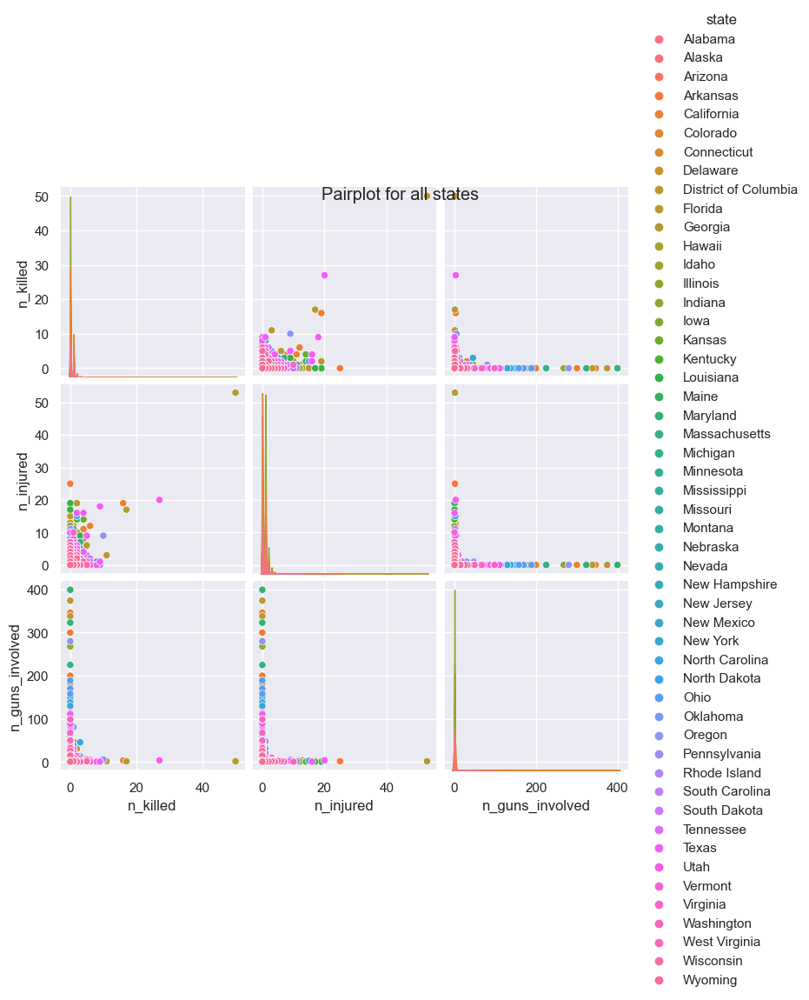

In [179]:
sns.pairplot(pair_df, kind='scatter',hue='state')
plt.suptitle('Pairplot for all states')
plt.show()

### Pair plot by state

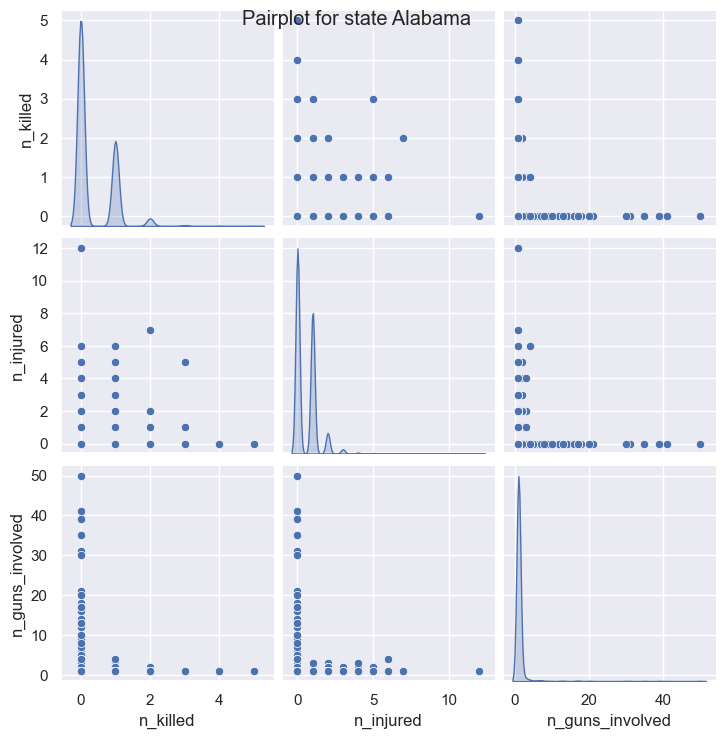

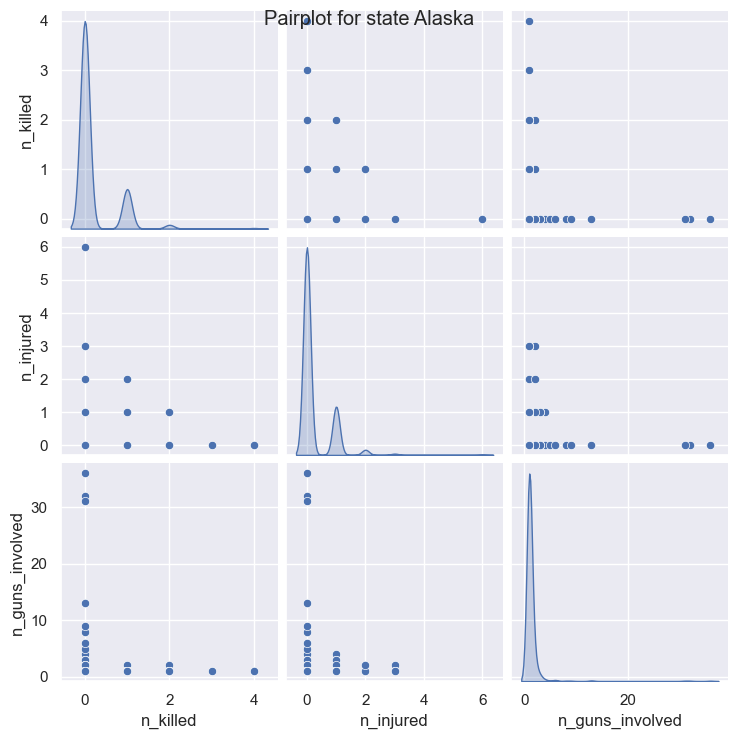

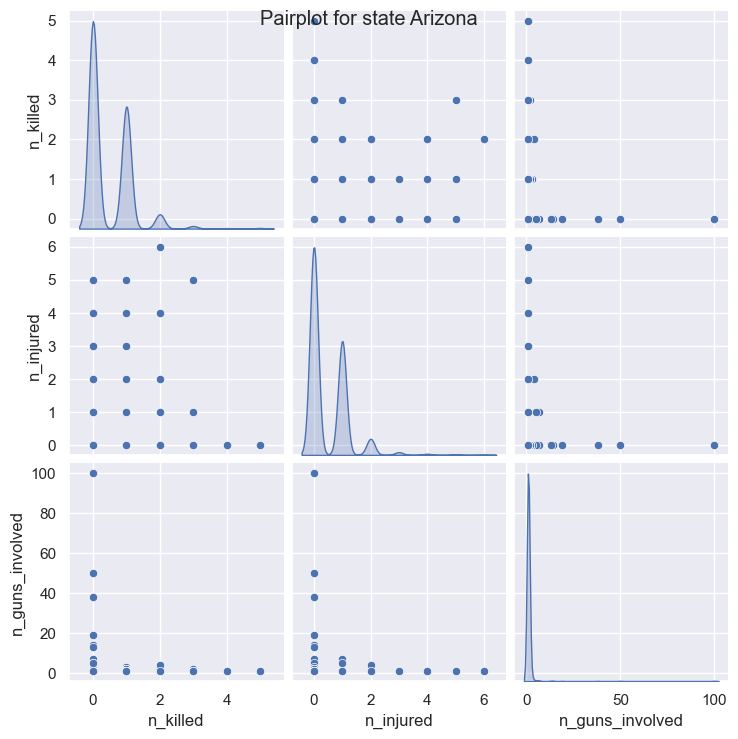

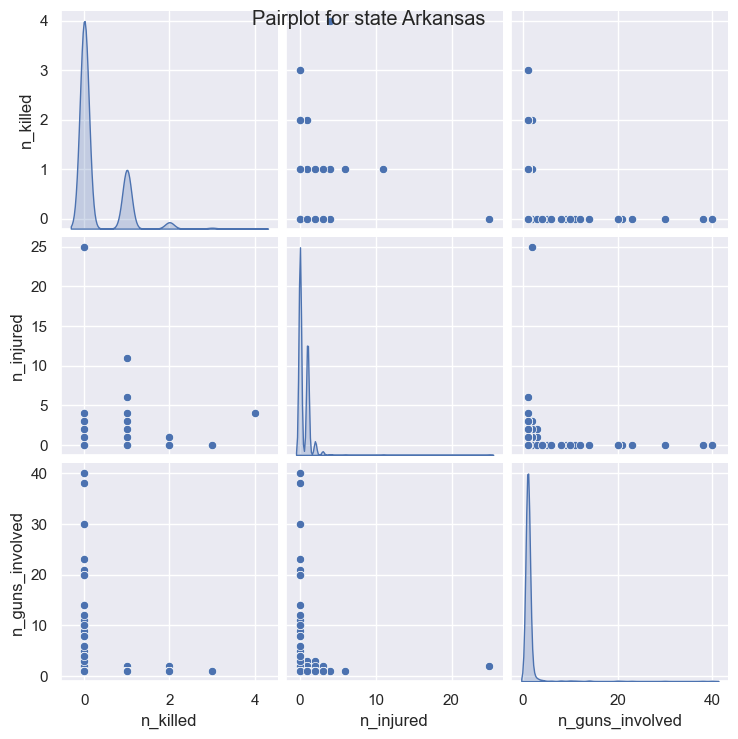

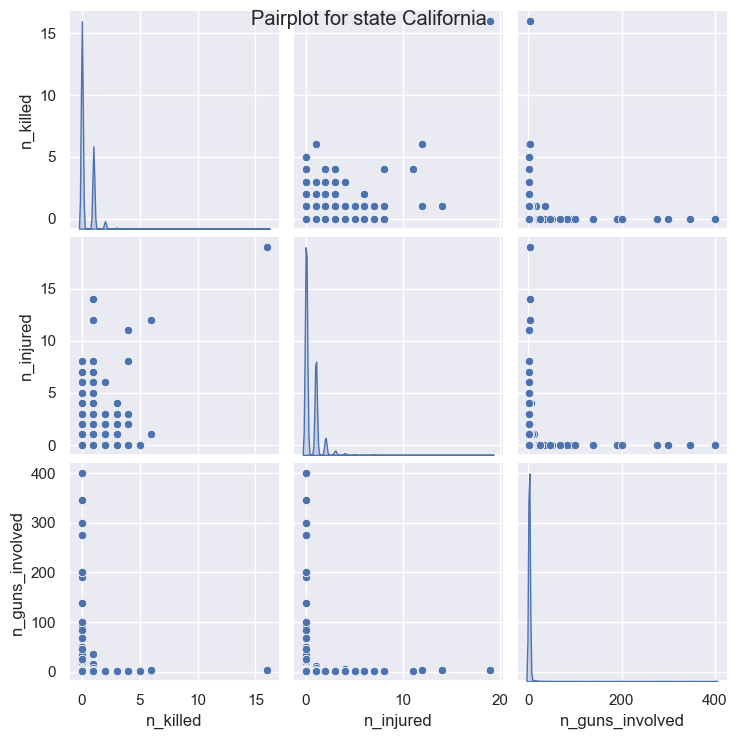

...

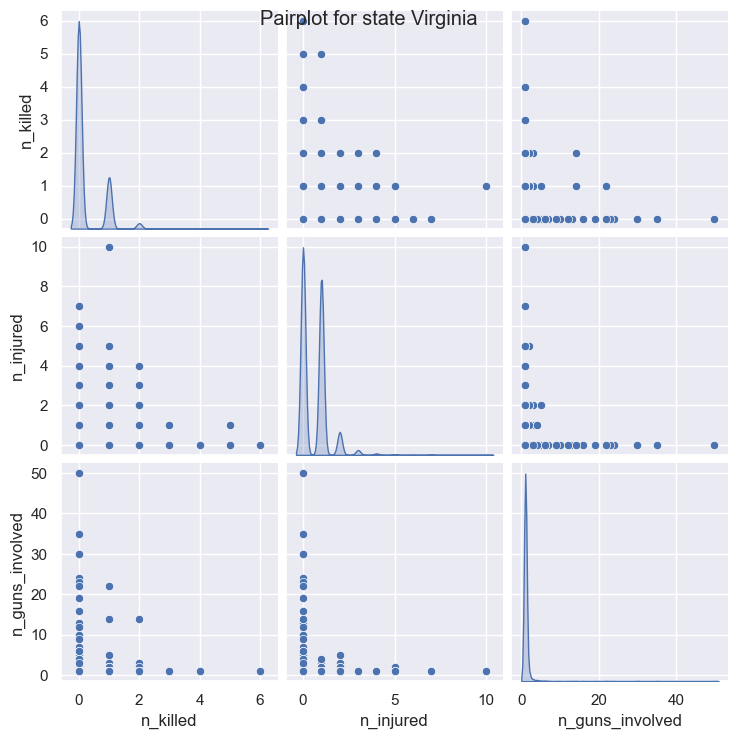

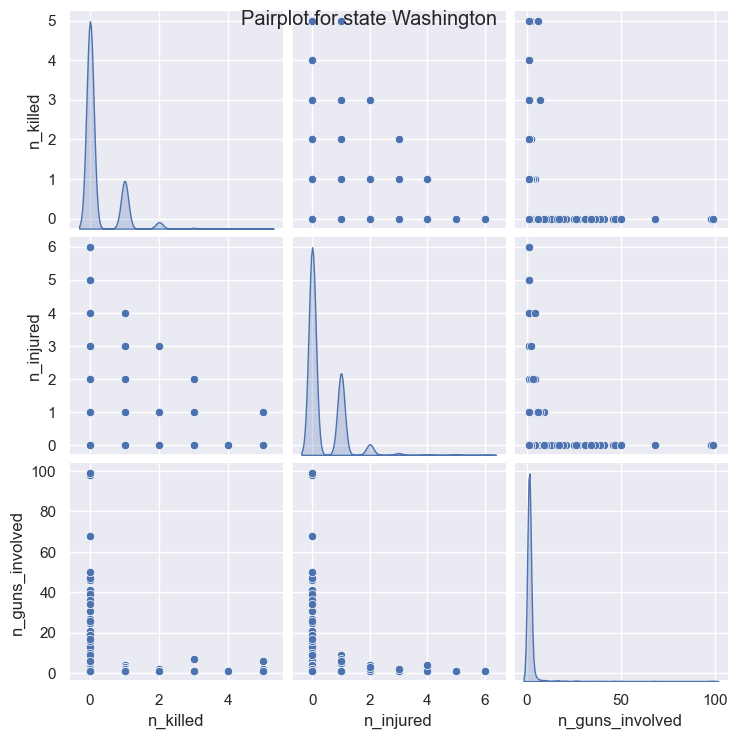

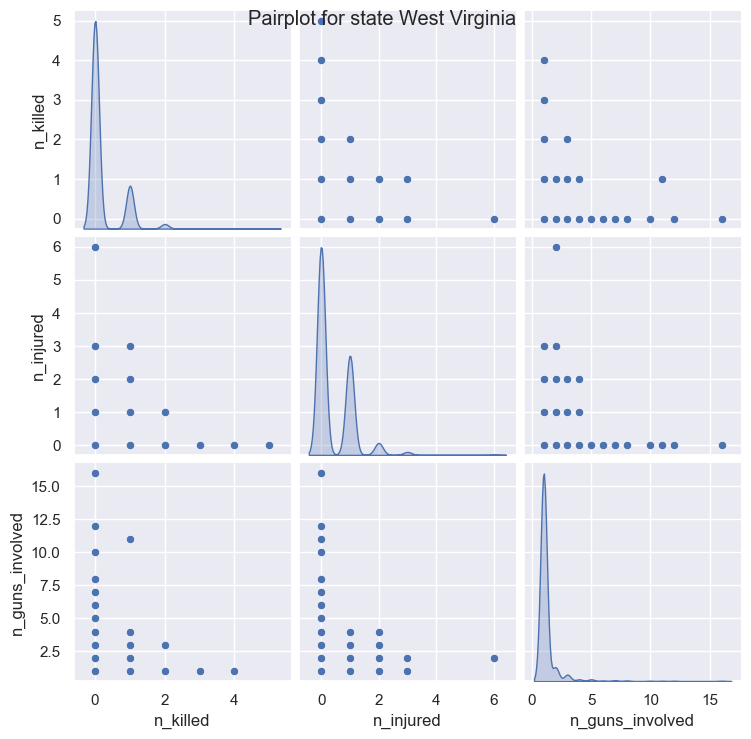

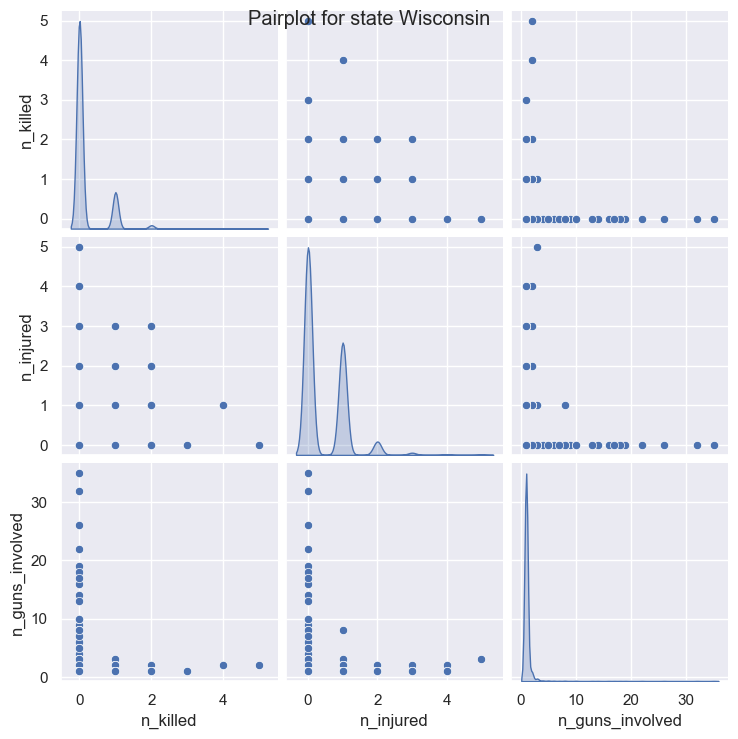

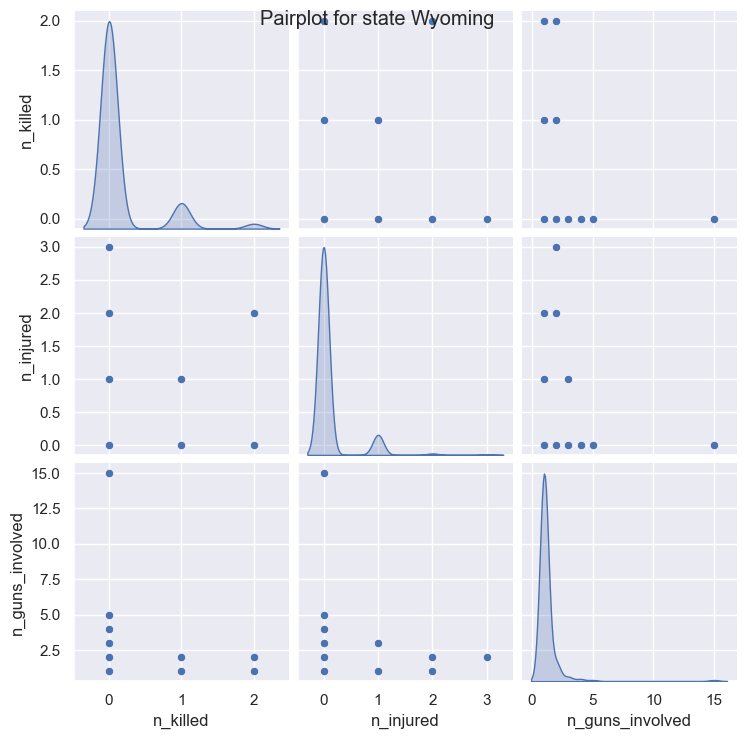

In [180]:
state_names = ["Alaska", "Alabama", "Arkansas", "Arizona", "California", "Colorado", "Connecticut", 
               "District of Columbia", "Delaware", "Florida", "Georgia", "Hawaii", "Iowa", "Idaho", "Illinois", 
               "Indiana", "Kansas", "Kentucky", "Louisiana", "Massachusetts", "Maryland", "Maine", "Michigan", "Minnesota", 
               "Missouri", "Mississippi", "Montana", "North Carolina", "North Dakota", "Nebraska", "New Hampshire", 
               "New Jersey", "New Mexico", "Nevada", "New York", "Ohio", "Oklahoma", "Oregon", "Pennsylvania", 
               "Rhode Island", "South Carolina", "South Dakota", "Tennessee", "Texas", "Utah", "Virginia", 
               "Vermont", "Washington", "Wisconsin", "West Virginia", "Wyoming"]
for state in sorted(state_names) :
    sns.pairplot(pair_df[pair_df['state']==state],kind='scatter',diag_kind='kde')
    plt.suptitle('Pairplot for state {}'.format(state))
    plt.show()

### Histogram of States vs Incidents

<AxesSubplot:>

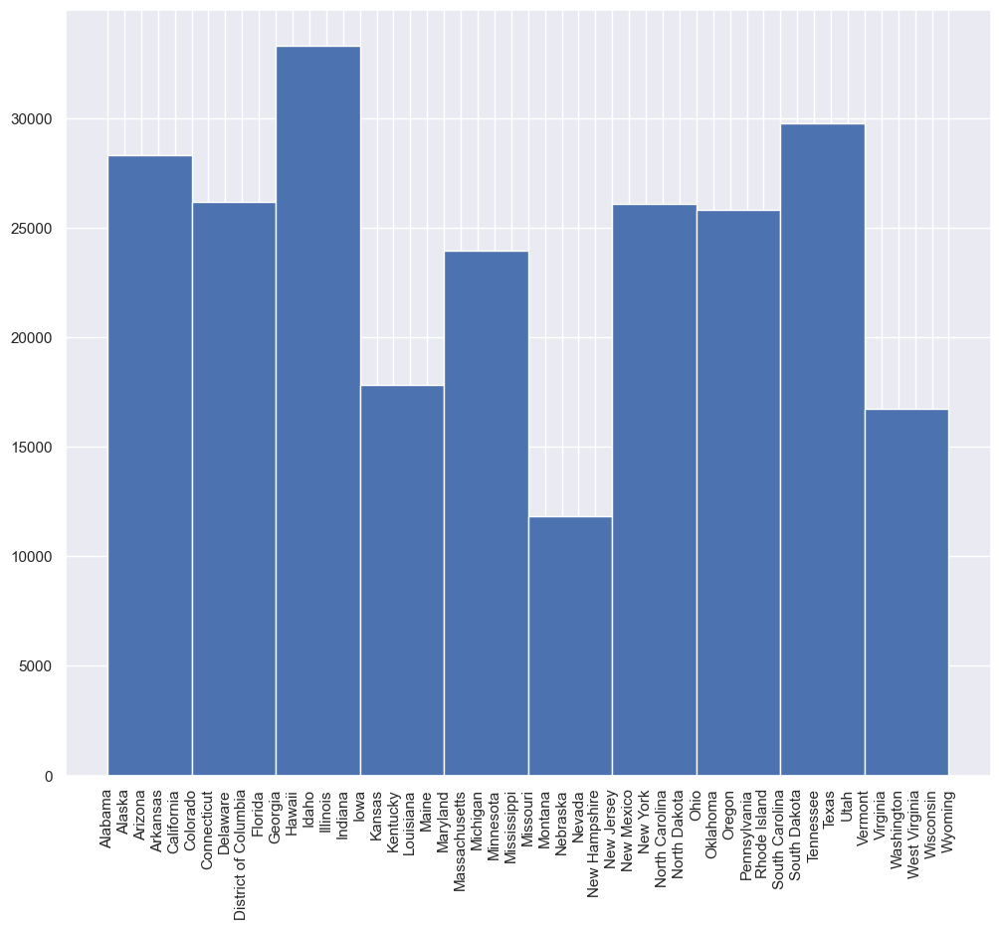

In [181]:
gun_df['state'].hist(xrot=90, figsize=(12.0,10.0))

### Longitude vs Latitude by Number Killed

Text(0.5, 0.98, 'Comparison of Number of Killed by Longitude and Latitude')

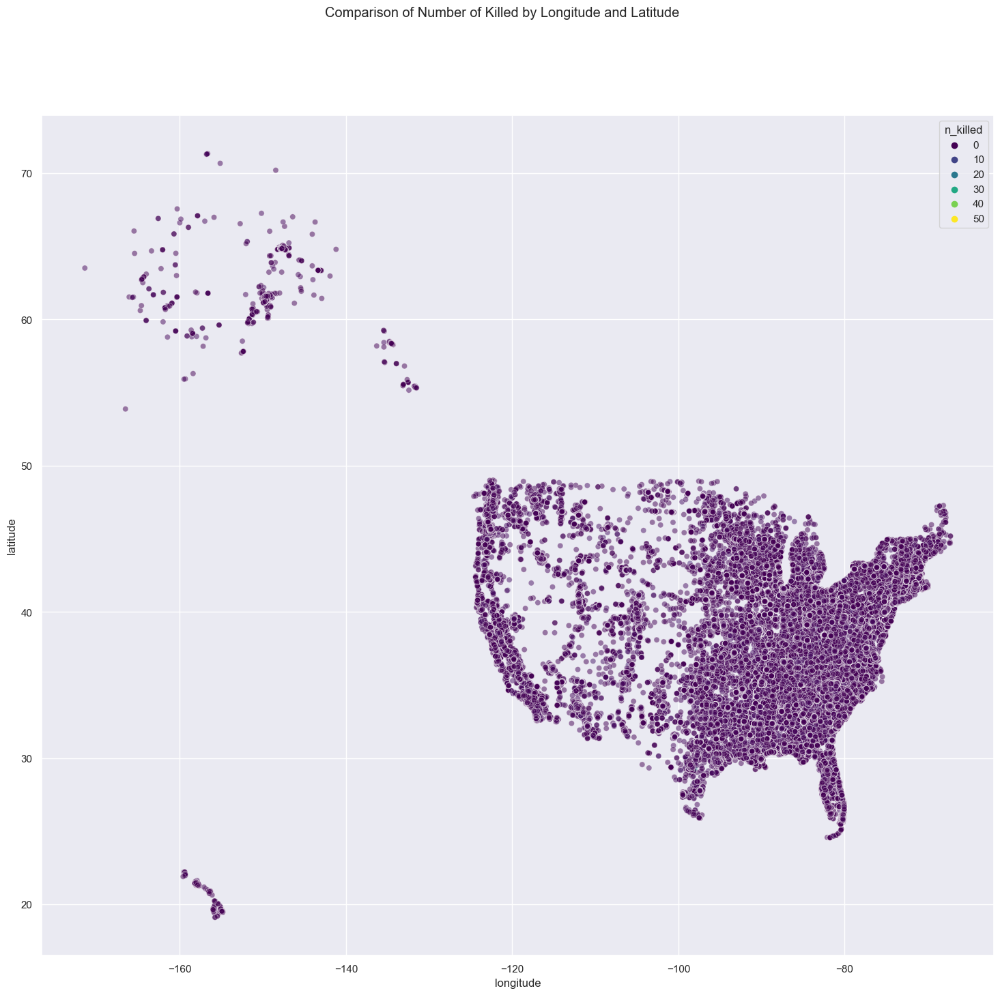

In [182]:
# just an idea
sns.scatterplot(data = gun_df, x="longitude", y="latitude", hue="n_killed",
                    palette="viridis", alpha=0.5)
plt.suptitle(f"Comparison of Number of Killed by Longitude and Latitude")

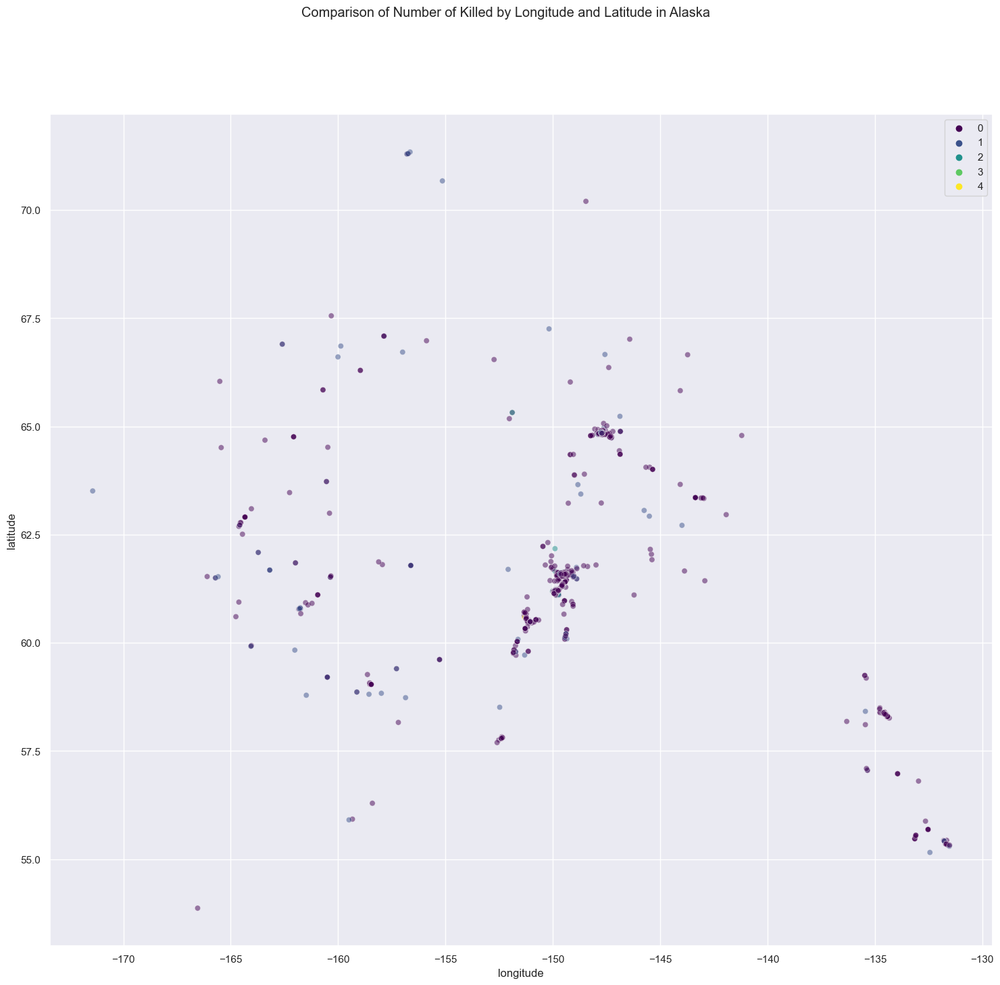

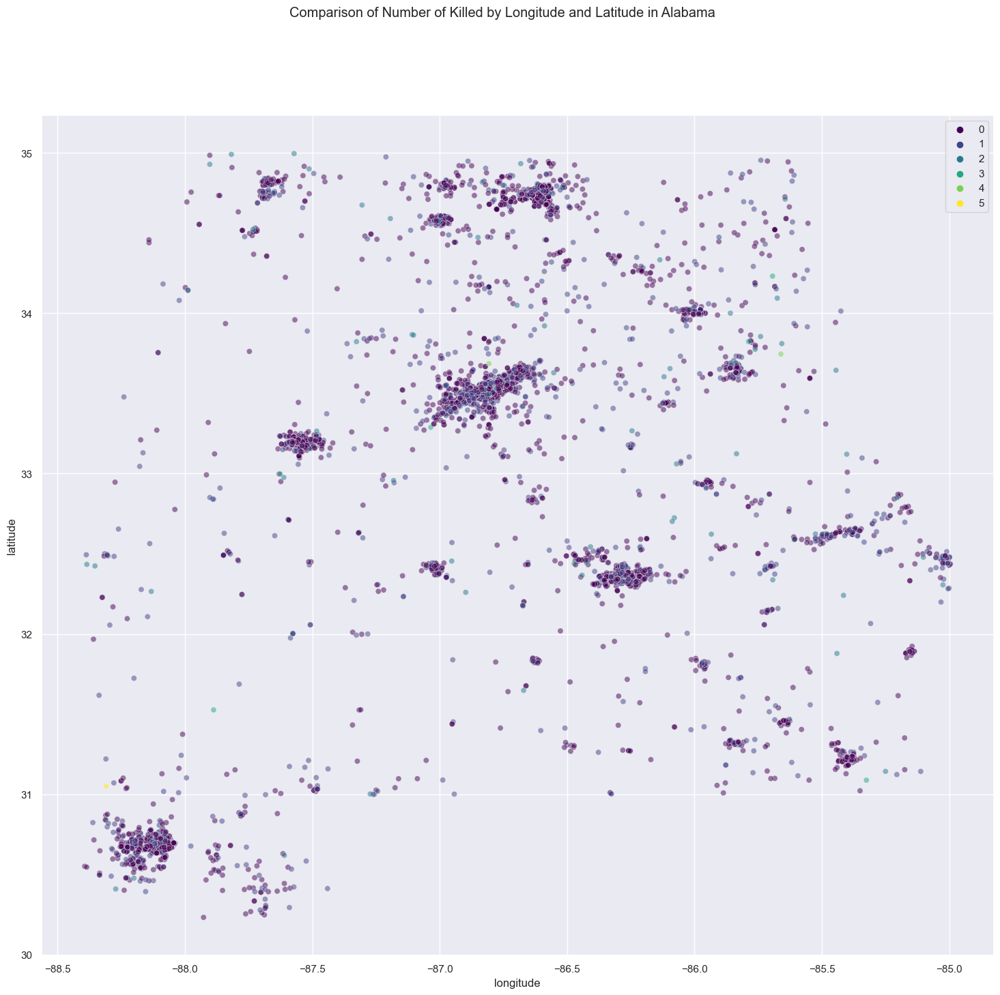

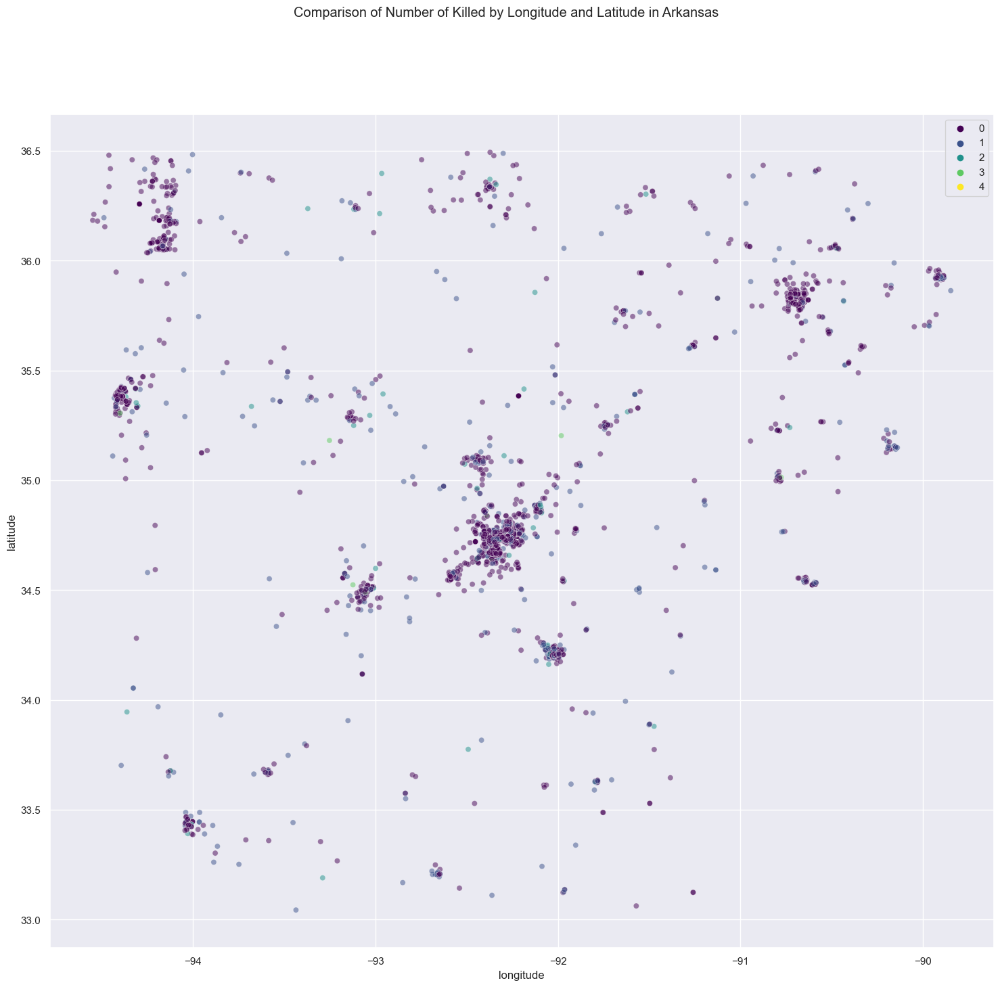

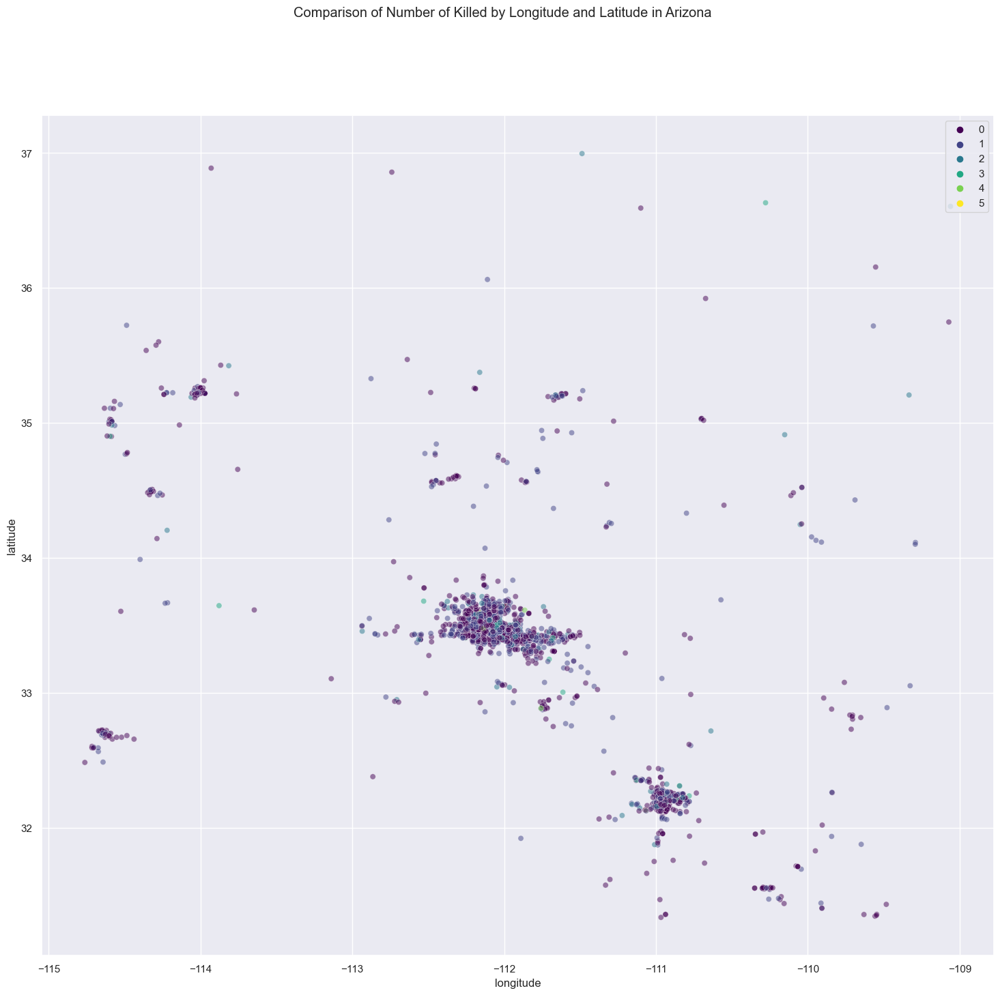

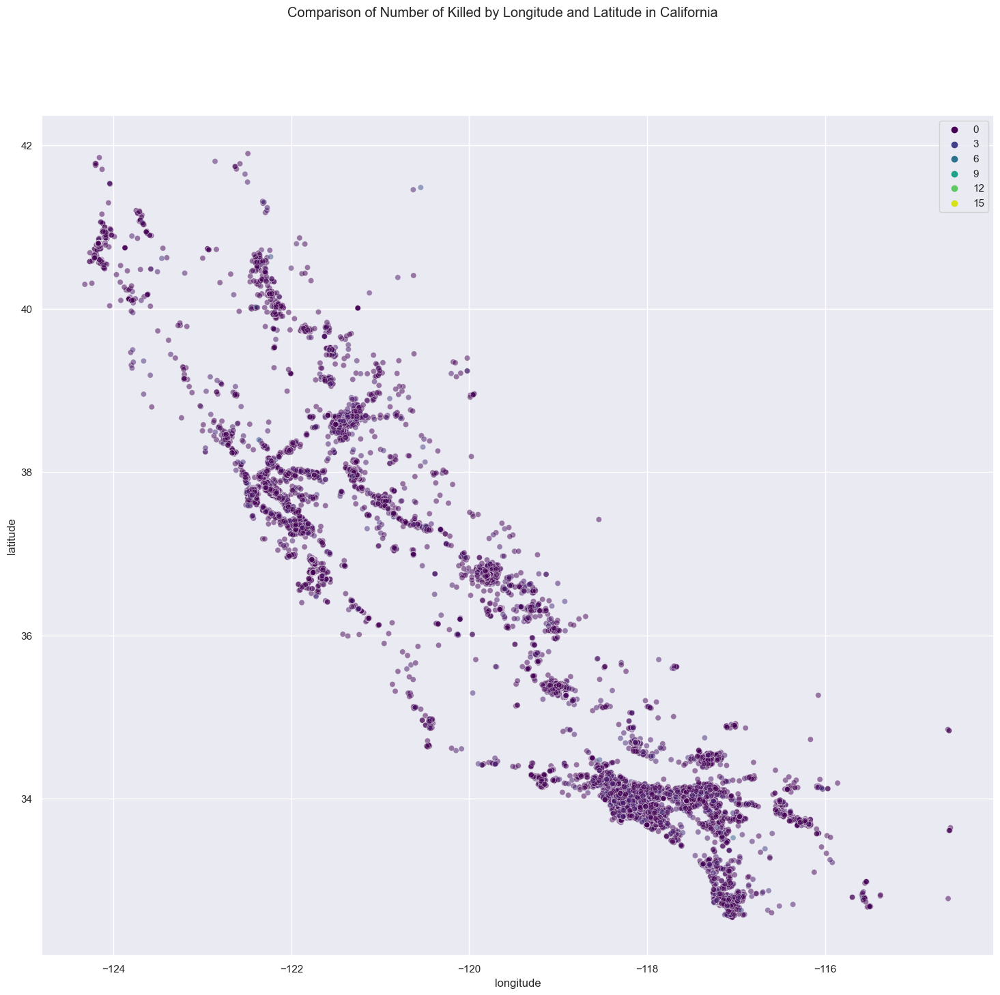

...

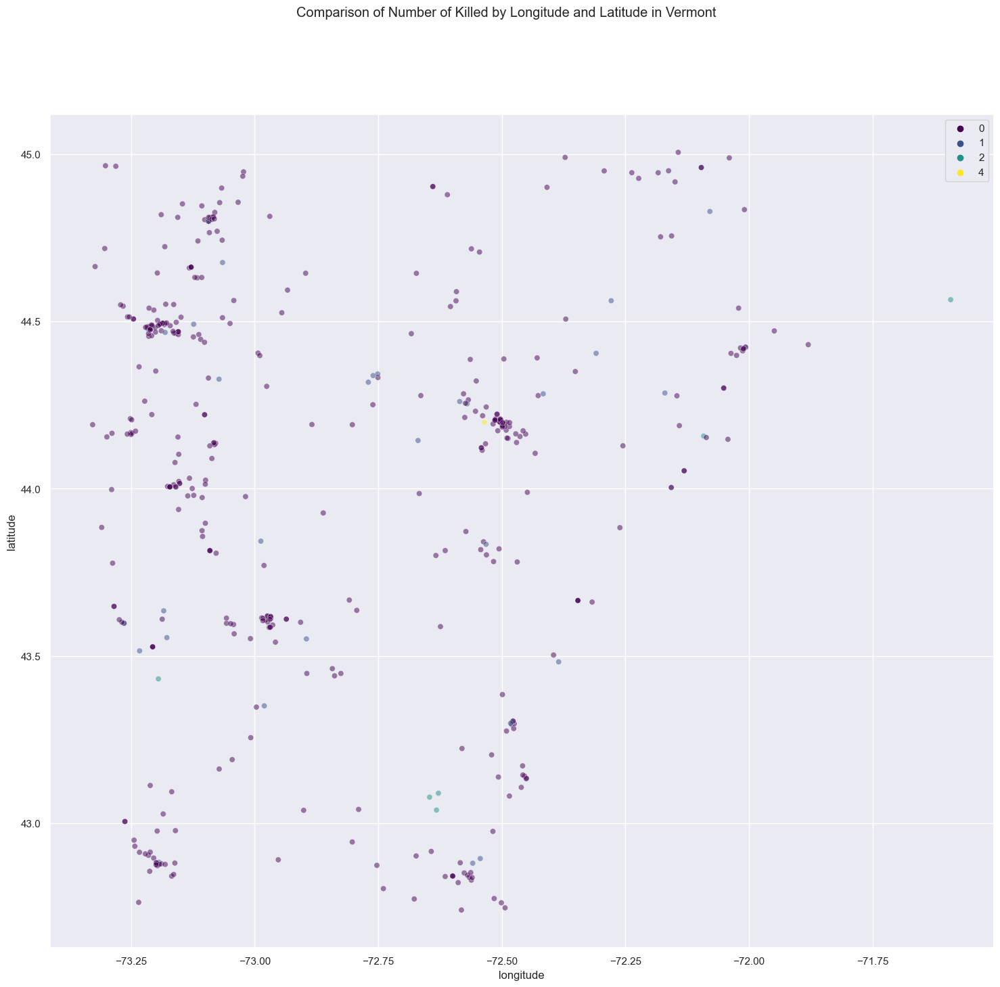

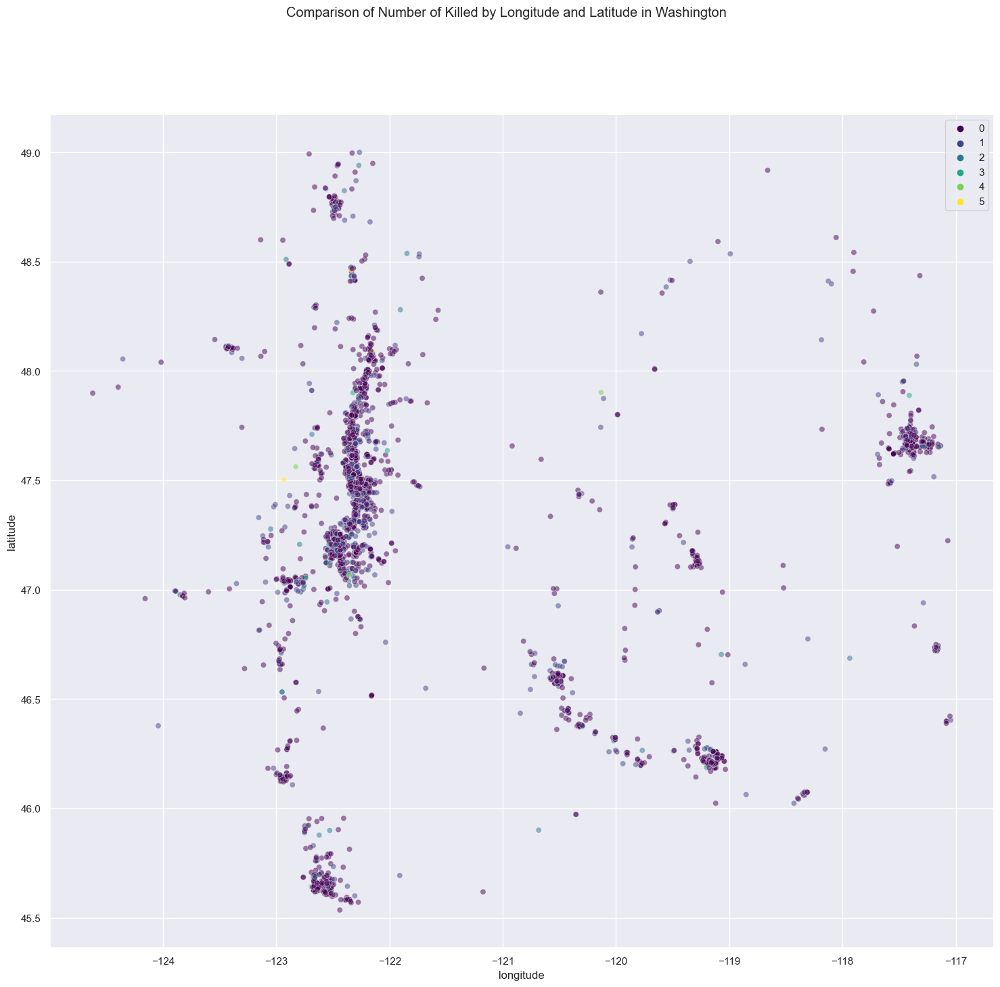

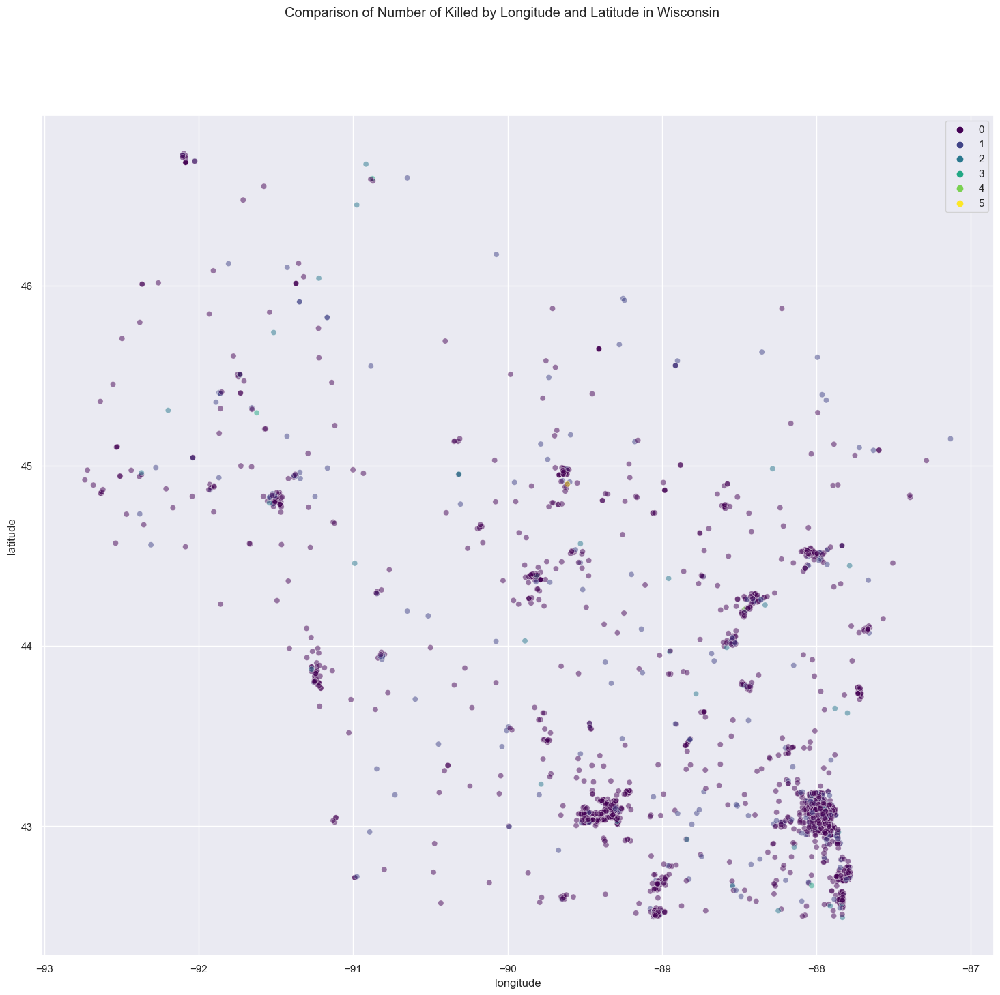

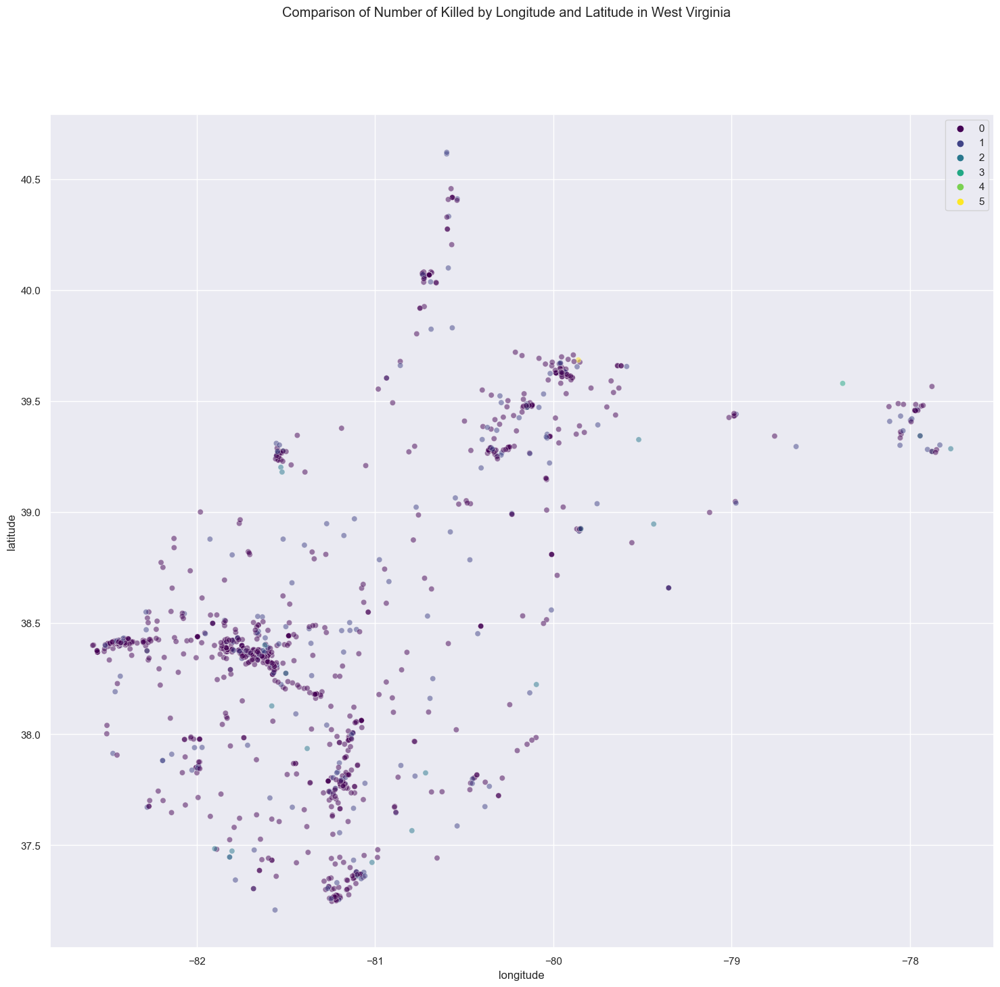

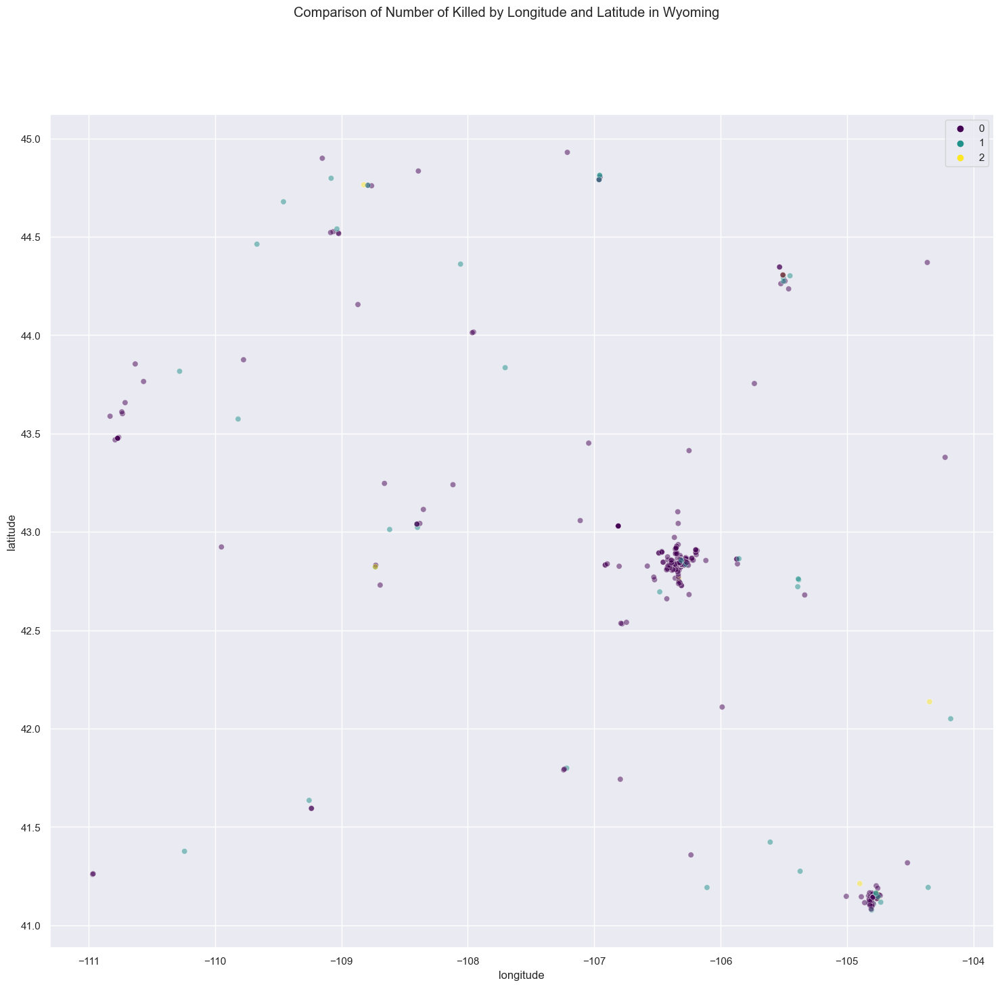

In [183]:
# just an idea
for state in state_names:
    sns.scatterplot(data = gun_df[gun_df['state']==state], x="longitude", y="latitude", hue="n_killed",
                    palette="viridis", alpha=0.5)
    plt.suptitle(f"Comparison of Number of Killed by Longitude and Latitude in {state}")
    plt.legend(loc = "upper right")
    plt.show()

## Violin Plots

## Maps of US? 

## Barplots and Pie Graphs


/Users/teresavail/.pyenv/versions/3.10.5/lib/python3.10/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]),
 [Text(0, 0, 'Alabama'),
  Text(1, 0, 'Alaska'),
  Text(2, 0, 'Arizona'),
  Text(3, 0, 'Arkansas'),
  Text(4, 0, 'California'),
  Text(5, 0, 'Colorado'),
  Text(6, 0, 'Connecticut'),
  Text(7, 0, 'Delaware'),
  Text(8, 0, 'District of Columbia'),
  Text(9, 0, 'Florida'),
  Text(10, 0, 'Georgia'),
  Text(11, 0, 'Hawaii'),
  Text(12, 0, 'Idaho'),
  Text(13, 0, 'Illinois'),
  Text(14, 0, 'Indiana'),
  Text(15, 0, 'Iowa'),
  Text(16, 0, 'Kansas'),
  Text(17, 0, 'Kentucky'),
  Text(18, 0, 'Louisiana'),
  Text(19, 0, 'Maine'),
  Text(20, 0, 'Maryland'),
  Text(21, 0, 'Massachusetts'),
  Text(22, 0, 'Michigan'),
  Text(23, 0, 'Minnesota'),
  Text(24, 0, 'Mississippi'),
  Text(25, 0, 'Missouri'),
  Text(26, 0, 'Montana'),
  Text(27, 0, 'Nebraska'),
  Text(28, 0, 'Neva

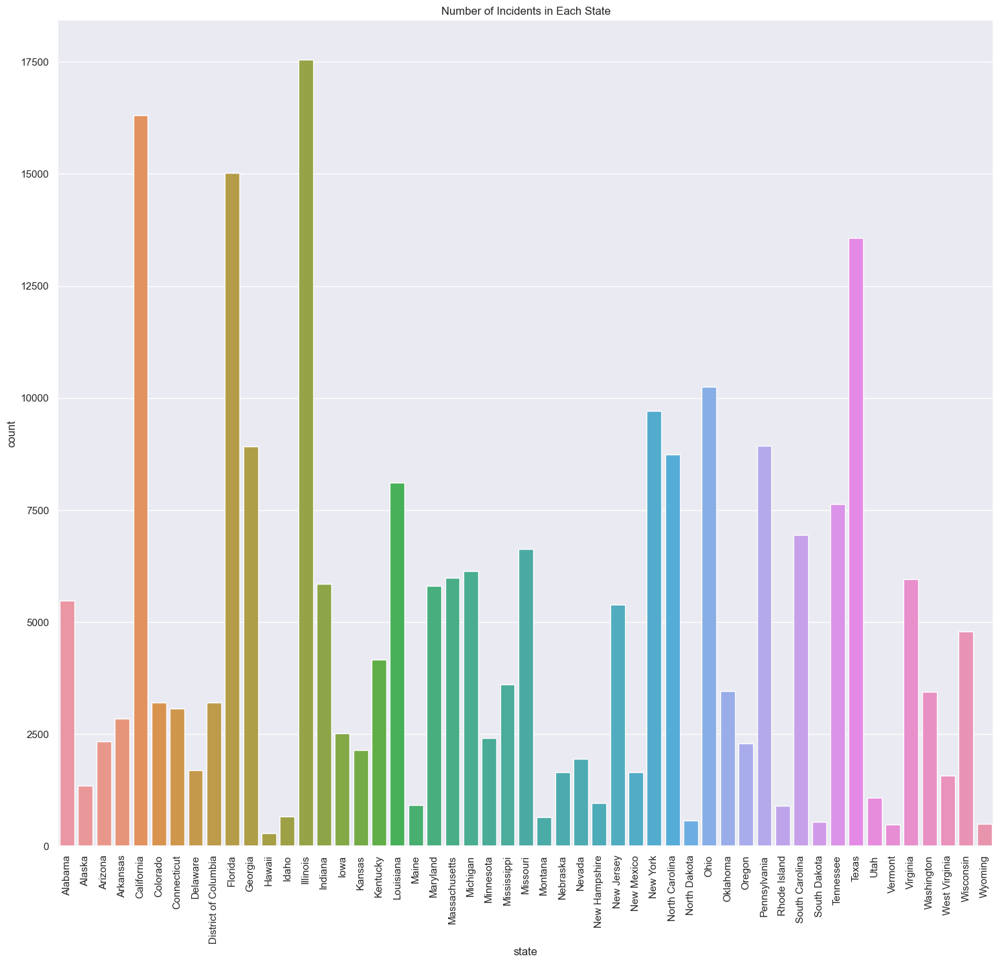

In [184]:
## Plotting the number of incidents for each state

import seaborn as sns

sns.set(rc={'figure.figsize': (18, 16)})
sns.countplot(gun_df.state).set(title='Number of Incidents in Each State')
plt.xticks(rotation =90)

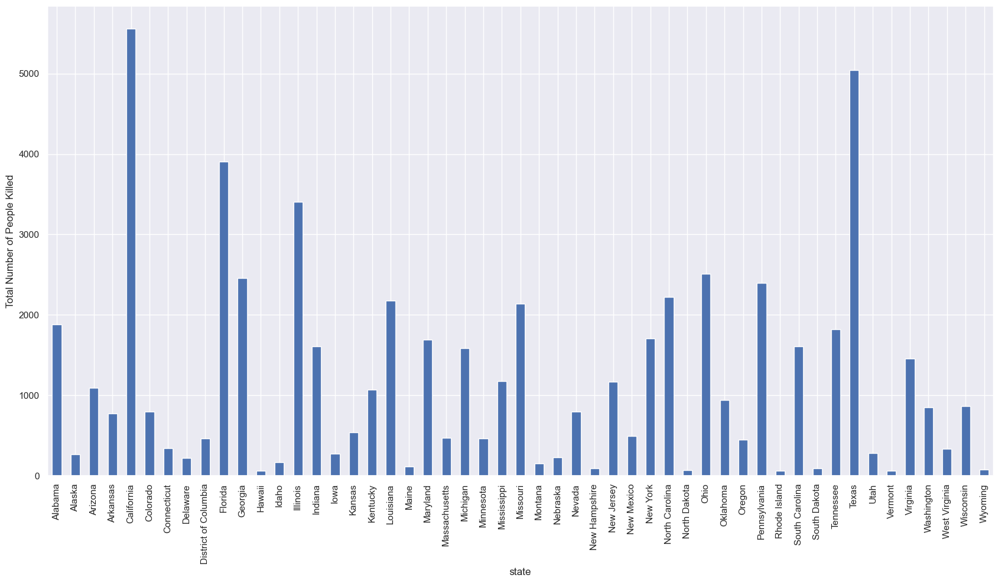

In [185]:
## Plotting the number of people killed for each state

import seaborn as sns

killed_df = gun_df.groupby('state')['n_killed'].sum()

ax = killed_df.plot.bar(figsize=(20,10), ylabel = "Total Number of People Killed")
plt.show()

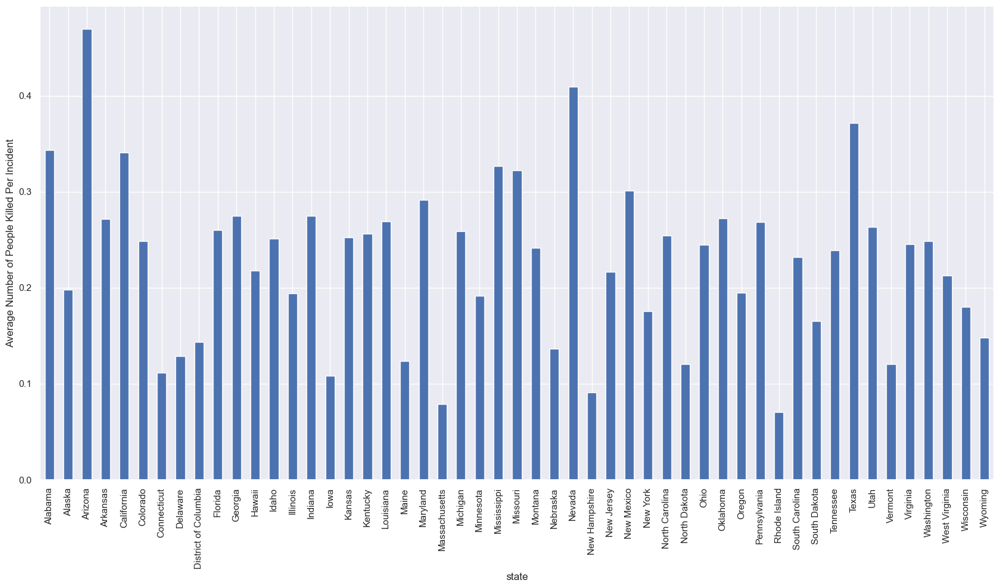

In [186]:
## Plotting the average number of people killed per incident for each state

import seaborn as sns

killed_avg_df = gun_df.groupby('state')['n_killed'].mean()

ax = killed_avg_df.plot.bar(figsize=(20,10), ylabel = "Average Number of People Killed Per Incident")
plt.show()

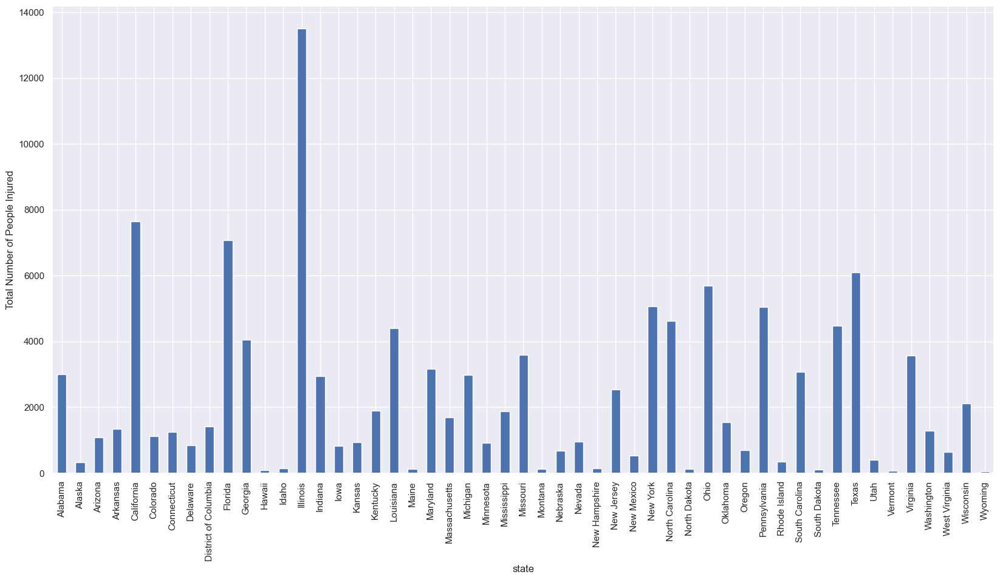

In [187]:
## Plotting the number of people injured for each state

import seaborn as sns

injured_df = gun_df.groupby('state')['n_injured'].sum()

ax = injured_df.plot.bar(figsize=(20,10), ylabel = "Total Number of People Injured")
plt.show()

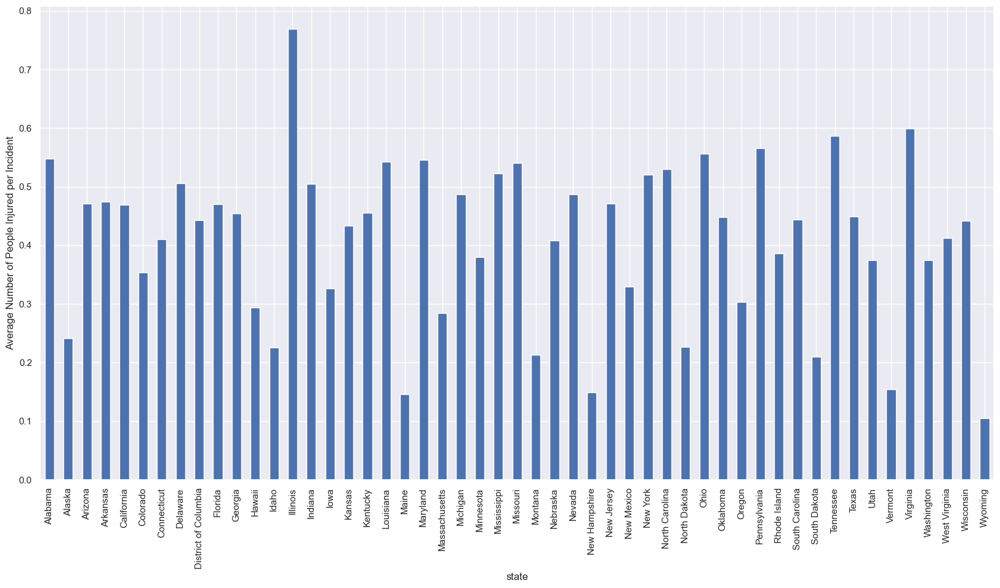

In [188]:
## Plotting the average number of people injured per incident for each state

import seaborn as sns

injured_avg_df = gun_df.groupby('state')['n_injured'].mean()

ax = injured_avg_df.plot.bar(figsize=(20,10), ylabel = "Average Number of People Injured per Incident")
plt.show()

In [189]:
gun_state_df = gun_df.groupby('state')

### Regression Models

In [190]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import Lasso
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

In [191]:
y = gun_df['n_killed']
X = gun_df.iloc[:,:8]

In [192]:
import random

random.seed(3254)
models = [LinearRegression(), DecisionTreeRegressor(random_state=42), 
          RandomForestRegressor(random_state=42),
          Lasso(),
          ElasticNet(random_state=42),
          Ridge()]

for model in models:
    print()
    print(model)
    model.fit(X, y)
    mse_scores = cross_val_score(model, X, y, scoring="neg_mean_squared_error", cv=10)
    scores = cross_val_score(model, X, y, scoring='r2', cv=10)
    rmse_scores = np.sqrt(-mse_scores)
    print("r2 mean:\n", scores.mean())
    print("RMSE mean:\n", rmse_scores.mean())


LinearRegression()


ValueError: could not convert string to float: '2013-07-06'